# 코드 내용

1. MRI 데이터 가지고 학습 돌리는 것은 같음
2. CNN 모델 돌리는 부분에서 test의 f1_score가 99%이상 나올 때 까지 반복하는 코드
3. 99%이상 나온 모델 저장해서 그 모델 가지고 이미지 등분으로 새롭게 만든 이미지 분류 코드
    -  1부분, 2부분, 3부분 바꾸어서 결과 확인

In [1]:
import os
import tensorflow.compat.v1 as tf1

os.environ["CUDA_VISIBLE_DEVICES"] = "3"
config = tf1.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.1
session = tf1.Session(config=config)

2024-06-23 06:13:35.843219: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-23 06:13:35.941555: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-23 06:13:37.764749: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-23 06:13:40.238135: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4033 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:af:00.0, compute capabi

In [2]:
import os
print(os.environ["CUDA_VISIBLE_DEVICES"])


3


In [3]:
import os
import numpy as np
import random
import shutil

#"C:\Users\fu268\OneDrive\바탕 화면\치매\Dataset\경증 치매"
Non_data = "/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/image/Non+VAE"
Mild_data = "/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/image/Mild+VAE"

### 정상과 경증 증상 데이터 분할

In [4]:
# 정상과 경증 증상 데이터 분할

from sklearn.model_selection import train_test_split

def split_dataset(data, test_size=0.2):
    # 데이터를 train과 test로 분할합니다.
    X_train, X_test = train_test_split(data, test_size=test_size, random_state=42)
    return X_train, X_test

# "정상" 데이터
Non_train, Non_test = split_dataset(Non_data)

# "경증" 데이터
Mild_train, Mild_test = split_dataset(Mild_data)### 정상과 경증 증상 데이터 분할

### 1.Train data numpy array로 불러오기

In [5]:
import os
import numpy as np
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

# 이미지 파일 경로를 읽어오는 함수
def read_images_from_path(path):
    image_files = [f for f in os.listdir(path) if f.endswith(".jpg")]
    images = [os.path.join(path, f) for f in image_files]
    return images

# 이미지를 넘파이 배열로 변환하는 함수
def images_to_numpy(images):
    image_arrays = [mpimg.imread(image_path) for image_path in images]
    return np.array(image_arrays)

# 'MRI_치매_데이터' 디렉토리 내의 각 카테고리에 대한 이미지 경로 리스트 생성
base_dir = '/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/image/'
Non_image_paths = read_images_from_path(os.path.join(base_dir, "Non+VAE"))
Mild_image_paths = read_images_from_path(os.path.join(base_dir, "Mild+VAE"))

# 각 카테고리별로 이미지 경로 리스트를 분할
Non_train_paths, Non_test_paths = train_test_split(Non_image_paths, test_size=0.2, random_state=42)
Mild_train_paths, Mild_test_paths = train_test_split(Mild_image_paths, test_size=0.2, random_state=42)

# 분할된 이미지 경로를 사용하여 넘파이 배열 생성
numpy_array_Non = images_to_numpy(Non_train_paths)
numpy_array_Mild = images_to_numpy(Mild_train_paths)

# 넘파이 배열의 크기 확인
print("정상 데이터 크기:", numpy_array_Non.shape)
print("경증 데이터 크기:", numpy_array_Mild.shape)


정상 데이터 크기: (3632, 128, 128)
경증 데이터 크기: (1061, 128, 128)


### 2.Train data의 label 원핫인코딩

In [6]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels.astype(int)]

# 각 클래스에 대한 레이블 생성
num_classes = 2  # 클래스 개수에 따라 조절
labels_Non = one_hot_encode(np.zeros(len(numpy_array_Non)), num_classes)
labels_Mild = one_hot_encode(np.ones(len(numpy_array_Mild)), num_classes)

# 데이터 확인
print("Moderate Demented Labels Shape:", labels_Non.shape)
print("Non Demented Labels Shape:", labels_Mild.shape)


# y 변수 생성
y_Non = labels_Non
y_Mild = labels_Mild

Moderate Demented Labels Shape: (3632, 2)
Non Demented Labels Shape: (1061, 2)


In [7]:
print(y_Non[:2])
print(y_Mild[:2])

[[1. 0.]
 [1. 0.]]
[[0. 1.]
 [0. 1.]]


### 3. Train dataset 구축(Train data 3종류 합치고, shape 변경 및 셔플)

In [8]:
# Moderate_Demented, Non_Demented, Very_Mild_Demented 데이터 합치기
X_train = np.concatenate((numpy_array_Non, numpy_array_Mild), axis=0)

# 각 데이터에 대한 레이블 합치기
y_train = np.concatenate((y_Non, y_Mild), axis=0)

# 데이터와 레이블의 형태 확인
print("X_train Shape:", X_train.shape)
print("y_train Shape:", y_train.shape)

# 데이터와 레이블을 함께 섞기
indices = np.arange(X_train.shape[0])
np.random.shuffle(indices)

X_train = X_train[indices]
X_train = np.reshape(X_train, (-1,128,128,1))
y_train = y_train[indices]

X_train = X_train / 255.

# 섞인 데이터와 레이블의 형태 확인
print("Shuffled X_train Shape:", X_train.shape)
print("Shuffled y_train Shape:", y_train.shape)

X_train Shape: (4693, 128, 128)
y_train Shape: (4693, 2)
Shuffled X_train Shape: (4693, 128, 128, 1)
Shuffled y_train Shape: (4693, 2)


### 4. Train dataset 이미지로 시각화 해보기

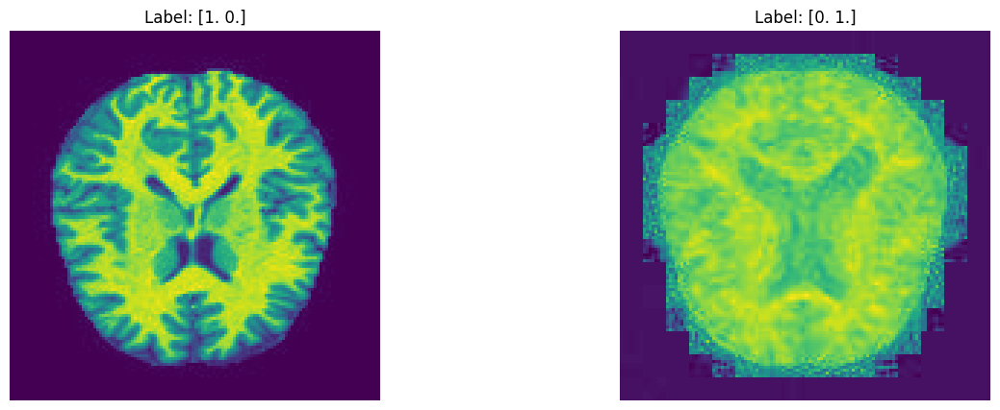

In [9]:
import matplotlib.pyplot as plt
# 원하는 레이블에 해당하는 이미지 무작위로 선택
desired_labels = np.array([[1, 0], [0, 1]])
selected_images = []
selected_labels = []

for label in desired_labels:
    # 해당 레이블에 해당하는 인덱스 추출
    indices = np.where((y_train == label).all(axis=1))[0]
    
    # 해당 인덱스 중 무작위로 1개 선택
    random_index = np.random.choice(indices, 1)[0]
    
    # 이미지 및 레이블 저장
    selected_images.append(X_train[random_index])
    selected_labels.append(y_train[random_index])

# 선택한 이미지 플로팅
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for i in range(2):
    axes[i].imshow(selected_images[i])
    axes[i].set_title(f"Label: {selected_labels[i]}")
    axes[i].axis('off')

plt.show()


In [10]:
print(np.max(X_train[0]), np.min(X_train[0]))

0.6549019607843137 0.0


# 
### Test data 불러오기

In [11]:
import matplotlib.image as mpimg

# 이미지 파일 경로를 읽어오는 함수
def read_images_from_path(path):
    image_files = [f for f in os.listdir(path) if f.endswith(".jpg")]
    images = [os.path.join(path, f) for f in image_files]
    return images

# 이미지를 넘파이 배열로 변환하는 함수
def images_to_numpy(images):
    image_arrays = [mpimg.imread(image_path) for image_path in images]
    return np.array(image_arrays)

# 'MRI_치매_데이터' 디렉토리 내의 각 카테고리에 대한 이미지 경로 리스트 생성
base_dir = '/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/image/'
Non_image_paths = read_images_from_path(os.path.join(base_dir, "Non_Demented_test"))
Mild_image_paths = read_images_from_path(os.path.join(base_dir, "Mild_Demented_test"))

# 각 카테고리별로 이미지 경로 리스트를 분할
Non_train_paths, normal_test_paths = train_test_split(Non_image_paths, test_size=0.2, random_state=42)
Mild_train_paths, Non_normal_test_paths = train_test_split(Mild_image_paths, test_size=0.2, random_state=42)

# 분할된 이미지 경로를 사용하여 넘파이 배열 생성
numpy_array_Non = images_to_numpy(Non_train_paths)
numpy_array_Mild = images_to_numpy(Mild_train_paths)

# 넘파이 배열의 크기 확인
print("정상 데이터 크기:", numpy_array_Non.shape)
print("경증 데이터 크기:", numpy_array_Mild.shape)


정상 데이터 크기: (768, 128, 128)
경증 데이터 크기: (215, 128, 128)


In [12]:
def one_hot_encode(labels, num_classes):
    return np.eye(num_classes)[labels.astype(int)]

# 각 클래스에 대한 레이블 생성
num_classes = 2  # 클래스 개수에 따라 조절
labels_Non = one_hot_encode(np.zeros(len(numpy_array_Non)), num_classes)
labels_Mild = one_hot_encode(np.ones(len(numpy_array_Mild)), num_classes)

# 데이터 확인
print("Non Demented Labels Shape:", labels_Non.shape)
print("Mild Demented Labels Shape:", labels_Mild.shape)


# y 변수 생성
y_Non = labels_Non
y_Mild = labels_Mild

Non Demented Labels Shape: (768, 2)
Mild Demented Labels Shape: (215, 2)


In [13]:

# Moderate_Demented, Non_Demented, Very_Mild_Demented 데이터 합치기
X_test = np.concatenate((numpy_array_Non, numpy_array_Mild), axis=0)

# 각 데이터에 대한 레이블 합치기
y_test = np.concatenate((y_Non, y_Mild), axis=0)

# 데이터와 레이블의 형태 확인
print("X_train Shape:", X_test.shape)
print("y_train Shape:", y_test.shape)

# 데이터와 레이블을 함께 섞기
indices = np.arange(X_test.shape[0])
np.random.shuffle(indices)

X_test = X_test[indices]
X_test = np.reshape(X_test, (-1,128,128,1))
X_test = X_test / 255.
y_test = y_test[indices]

# 섞인 데이터와 레이블의 형태 확인
print("Shuffled X_test Shape:", X_test.shape)
print("Shuffled y_test Shape:", y_test.shape)

X_train Shape: (983, 128, 128)
y_train Shape: (983, 2)
Shuffled X_test Shape: (983, 128, 128, 1)
Shuffled y_test Shape: (983, 2)


### 5. 모델 학습 및 test 값 확인

In [14]:
# import tensorflow as tf
# from tensorflow.keras import layers, models
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# from sklearn.metrics import f1_score



# # CNN 모델 정의
# model = models.Sequential()
# model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.Flatten())
# model.add(layers.Dense(64, activation='relu'))
# model.add(layers.Dense(2, activation='softmax'))  # 3은 클래스의 개수에 따라 조절

# # 모델 컴파일
# model.compile(optimizer='adam',
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# print(model.summary())
# # 데이터 학습
# history = model.fit(X_train, y_train, epochs=15, batch_size=32, validation_split=0.2)



# y_pred_train = model.predict(X_train)

# # Confusion Matrix 계산
# conf_matrix = confusion_matrix(np.argmax(y_train, axis=1), np.argmax(y_pred_train, axis=1))


# y_pred_labels = np.argmax(y_pred_train, axis=1)
# y_true_labels = np.argmax(y_train, axis=1)

# # F1 Score 계산
# f1 = f1_score(y_true_labels, y_pred_labels, average='weighted')

# print(f"F1 Score: {f1}")


# # 테스트 데이터 예측
# y_pred_test = model.predict(X_test)

# # Confusion Matrix 계산
# conf_matrix = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_test, axis=1))





In [15]:
# import tensorflow as tf
# from tensorflow.keras import layers, models
# from tensorflow.keras.callbacks import EarlyStopping
# from sklearn.metrics import confusion_matrix, f1_score
# import numpy as np

# # CNN 모델 정의 함수
# def create_model():
#     model = models.Sequential()
#     model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)))
#     model.add(layers.MaxPooling2D((2, 2)))
#     model.add(layers.Conv2D(64, (3, 3), activation='relu'))
#     model.add(layers.MaxPooling2D((2, 2)))
#     model.add(layers.Conv2D(64, (3, 3), activation='relu'))
#     model.add(layers.Flatten())
#     model.add(layers.Dense(64, activation='relu'))
#     model.add(layers.Dense(2, activation='softmax'))  # 2는 클래스의 개수에 따라 조절

#     model.compile(optimizer='adam',
#                   loss='categorical_crossentropy',
#                   metrics=['accuracy'])
#     return model

# # 초기 설정
# max_epochs = 15
# batch_size = 32
# target_f1_score = 0.99
# repetition_count = 0
# f1_scores = []

# # 데이터셋 로드 (사용자의 X_train, y_train, X_test, y_test가 이미 존재한다고 가정)
# # X_train, y_train, X_test, y_test는 사용자 데이터셋에 따라 정의되어 있어야 합니다.

# # 반복 학습
# while True:
#     repetition_count += 10
#     print(f"Repetition: {repetition_count}")

#     # 모델 생성 및 학습
#     model = create_model()
#     history = model.fit(X_train, y_train, epochs=max_epochs, batch_size=batch_size, validation_split=0.2)

#     # 테스트 데이터 예측
#     y_pred_test = model.predict(X_test)

#     # 테스트 데이터에 대한 예측값에서 가장 높은 확률의 클래스를 추출
#     y_pred_test_labels = np.argmax(y_pred_test, axis=1)
#     y_true_test_labels = np.argmax(y_test, axis=1)

#     # F1 Score 계산
#     f1 = f1_score(y_true_test_labels, y_pred_test_labels, average='weighted')
#     f1_scores.append(f1)

#     print(f"F1 Score: {f1}")

#     # 목표 F1 Score 도달 시 모델 저장 및 종료
#     # if repetition_count == 1:
#     #     break
#     if f1 >= target_f1_score:
#         model.save('/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/VAE_best_model.h5')
#         print(f"Model saved after {repetition_count} repetitions with F1 Score: {f1}")
#         break

# # 반복 횟수와 F1 Scores 출력
# print(f"Total repetitions: {repetition_count}")
# print(f"All F1 Scores: {f1_scores}")


In [16]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model
from sklearn.metrics import f1_score

# CNN 모델 정의 함수
def create_model():
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(2, activation='softmax'))  # 2는 클래스의 개수에 따라 조절

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# 초기 설정
max_epochs = 15
batch_size = 32
target_f1_score = 0.99
repetition_count = 0
f1_scores = []

# 반복 학습
while True:
    repetition_count += 1
    print(f"Repetition: {repetition_count}")

    # 모델 생성 및 학습
    model = create_model()
    history = model.fit(X_train, y_train, epochs=max_epochs, batch_size=batch_size, validation_split=0.2)

    # 테스트 데이터 예측
    y_pred_test = model.predict(X_test)

    # 테스트 데이터에 대한 예측값에서 가장 높은 확률의 클래스를 추출
    y_pred_test_labels = np.argmax(y_pred_test, axis=1)
    y_true_test_labels = np.argmax(y_test, axis=1)

    # F1 Score 계산
    f1 = f1_score(y_true_test_labels, y_pred_test_labels, average='weighted')
    f1_scores.append(f1)

    print(f"F1 Score: {f1}")

#     #목표 F1 Score 도달 시 모델 저장 및 종료
#     if f1 >= target_f1_score:
#         model.save('/home/b202192017/2024.05.29_전주대_학부생_4학년1학기_백업파일/2024/논문/new_idea_code/VAE_best_model.h5')
#         print(f"Model saved after {repetition_count} repetitions with F1 Score: {f1}")
#         break
    if repetition_count >= 1:
        break

# 반복 횟수와 F1 Scores 출력
print(f"Total repetitions: {repetition_count}")
print(f"All F1 Scores: {f1_scores}")


Repetition: 1


2024-06-23 06:13:45.360108: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4033 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:af:00.0, compute capability: 8.0


Epoch 1/15


2024-06-23 06:13:48.687550: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-06-23 06:13:48.881203: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-06-23 06:13:49.276223: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-06-23 06:13:49.342653: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x4bb0b00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-23 06:13:49.343136: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2024-06-23 06:13:49.352485: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-23 06:13:49.507767: I te

118/118 [==============================] - 10s 45ms/step - loss: 0.3104 - accuracy: 0.8801 - val_loss: 0.1994 - val_accuracy: 0.8978
Epoch 2/15
118/118 [==============================] - 3s 26ms/step - loss: 0.1766 - accuracy: 0.9193 - val_loss: 0.1410 - val_accuracy: 0.9414
Epoch 3/15
118/118 [==============================] - 3s 29ms/step - loss: 0.1053 - accuracy: 0.9584 - val_loss: 0.1287 - val_accuracy: 0.9553
Epoch 4/15
118/118 [==============================] - 3s 28ms/step - loss: 0.0562 - accuracy: 0.9782 - val_loss: 0.1179 - val_accuracy: 0.9627
Epoch 5/15
118/118 [==============================] - 3s 28ms/step - loss: 0.0514 - accuracy: 0.9782 - val_loss: 0.0637 - val_accuracy: 0.9787
Epoch 6/15
118/118 [==============================] - 4s 32ms/step - loss: 0.0264 - accuracy: 0.9896 - val_loss: 0.0691 - val_accuracy: 0.9755
Epoch 7/15
118/118 [==============================] - 3s 28ms/step - loss: 0.0071 - accuracy: 0.9973 - val_loss: 0.0499 - val_accuracy: 0.9872
Epoch 8/1

1/1 [==============================] - 0s 239ms/step


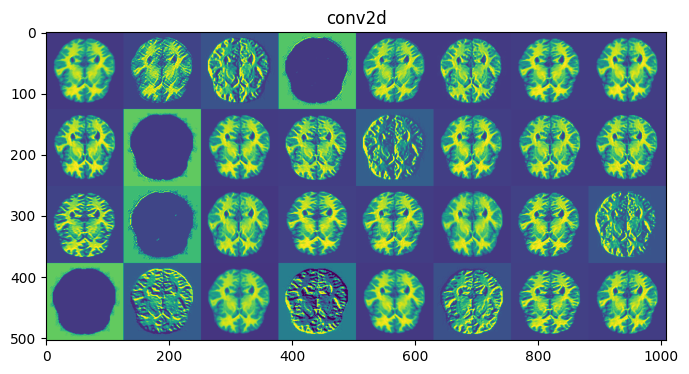

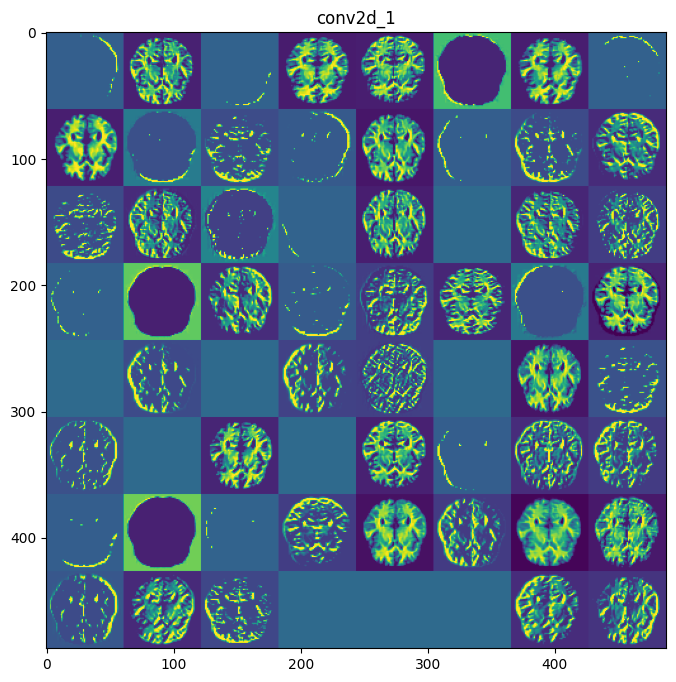

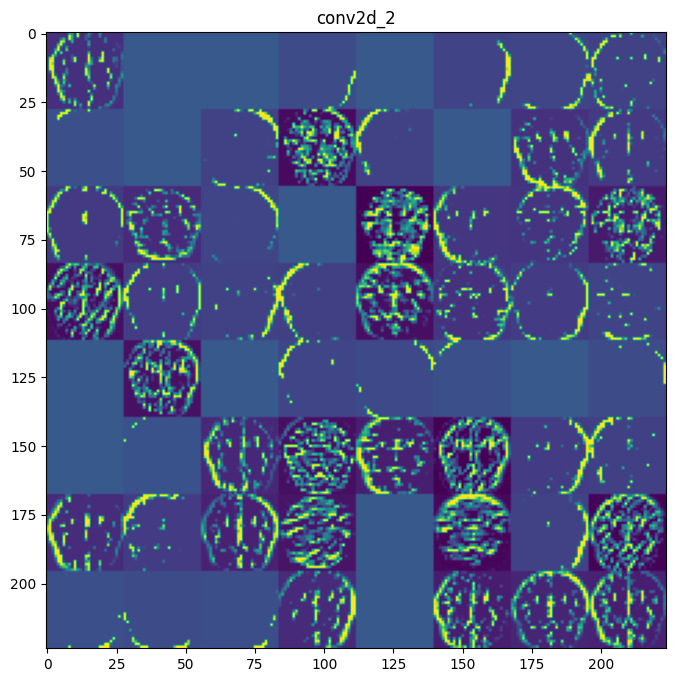

In [17]:
# 중간 레이어의 출력값을 추출하는 모델 정의
# CNN 모델에서 Conv2D 레이어의 출력값들을 추출하기 위해 새로운 모델을 정의합니다.
# 이는 중간 레이어의 활성화 값을 시각화하기 위해 필요합니다.
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 랜덤으로 테스트 이미지 선택
# X_test 데이터셋에서 무작위로 하나의 이미지를 선택하여 시각화에 사용합니다.
random_index = np.random.randint(0, X_test.shape[0])
test_image = X_test[random_index].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
# activation_model을 사용하여 test_image를 통과시키고, 각 Conv2D 레이어에서의 활성화 값을 얻습니다.
activations = activation_model.predict(test_image)

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
# layer_names는 Conv2D 레이어의 이름을 저장하는 리스트입니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 시각화에 사용될 이미지의 열 수를 정의합니다.
images_per_row = 8

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 한 열당 특징 맵을 몇 개 배치할지 계산합니다.
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 채널의 특징 맵을 그리드에 배치합니다.
    for col in range(n_cols):
        for row in range(images_per_row):
            # 활성화 값에서 각 채널을 추출
            channel_image = layer_activation[0, :, :, col * images_per_row + row]

            # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
            if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()

            # 이미지를 보기 좋게 조정
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            # 정규화된 이미지를 그리드에 배치
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드의 크기를 맞추기 위한 스케일을 설정
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    
    # 레이어 이름을 제목으로 설정
    plt.title(layer_name)
    plt.grid(False)
    
    # 최종적으로 그리드를 시각화 (각 레이어의 특징 맵을 이미지로 표시)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()


1/1 [==============================] - 0s 117ms/step


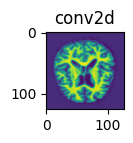

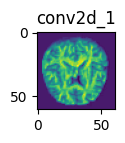

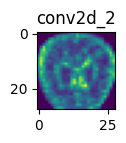

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 랜덤으로 테스트 이미지 선택
random_index = np.random.randint(0, X_test.shape[0])
test_image = X_test[random_index].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
activations = activation_model.predict(test_image)

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 활성화 맵들을 겹쳐서 하나의 이미지를 만듭니다.
    combined_image = np.zeros((size, size))

    # 각 채널의 특징 맵을 겹쳐서 하나의 이미지로 만듭니다.
    for i in range(n_features):
        channel_image = layer_activation[0, :, :, i]

        # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
        if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()

        # 이미지를 보기 좋게 조정
        channel_image *= 64
        channel_image += 128
        channel_image = np.clip(channel_image, 0, 255).astype('uint8')

        # 채널 이미지를 합산하여 겹침
        combined_image += channel_image

    # 합산한 이미지를 보기 좋게 정규화
    combined_image /= n_features
    combined_image = np.clip(combined_image, 0, 255).astype('uint8')

    # 스케일을 설정하여 시각화
    scale = 1. / size
    plt.figure(figsize=(scale * combined_image.shape[1], scale * combined_image.shape[0]))
    
    # 레이어 이름을 제목으로 설정
    plt.title(layer_name)
    plt.grid(False)
    
    # 최종적으로 합산된 이미지를 시각화
    plt.imshow(combined_image, aspect='auto', cmap='viridis')
    plt.show()


1/1 [==============================] - 0s 129ms/step


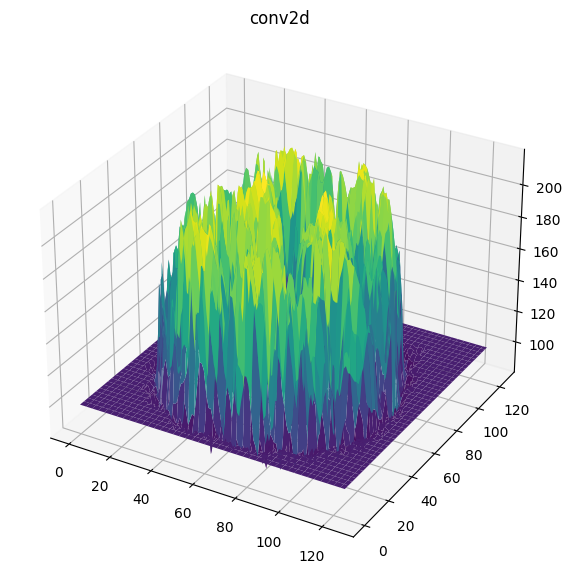

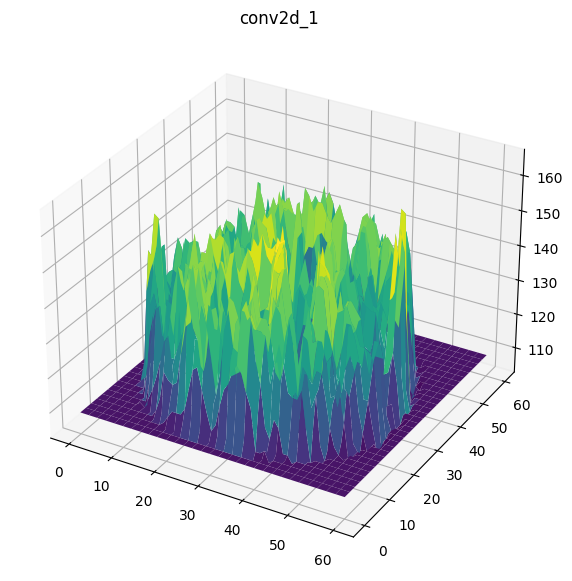

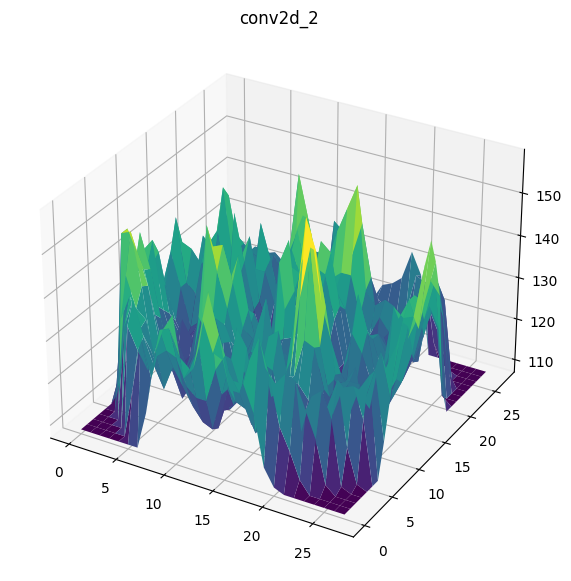

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 랜덤으로 테스트 이미지 선택
random_index = np.random.randint(0, X_test.shape[0])
test_image = X_test[random_index].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
activations = activation_model.predict(test_image)

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 활성화 맵들을 겹쳐서 하나의 이미지를 만듭니다.
    combined_image = np.zeros((size, size))

    # 각 채널의 특징 맵을 겹쳐서 하나의 이미지로 만듭니다.
    for i in range(n_features):
        channel_image = layer_activation[0, :, :, i]

        # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
        if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()

        # 이미지를 보기 좋게 조정
        channel_image *= 64
        channel_image += 128
        channel_image = np.clip(channel_image, 0, 255).astype('uint8')

        # 채널 이미지를 합산하여 겹침
        combined_image += channel_image

    # 합산한 이미지를 보기 좋게 정규화
    combined_image /= n_features
    combined_image = np.clip(combined_image, 0, 255).astype('uint8')

    # 3D 시각화를 위해 X, Y 좌표 생성
    x = np.linspace(0, combined_image.shape[1] - 1, combined_image.shape[1])
    y = np.linspace(0, combined_image.shape[0] - 1, combined_image.shape[0])
    x, y = np.meshgrid(x, y)
    z = combined_image

    # 3D 시각화
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 높낮이를 주어 3D로 시각화
    ax.plot_surface(x, y, z, cmap='viridis')

    # 레이어 이름을 제목으로 설정
    ax.set_title(layer_name)
    plt.show()


1/1 [==============================] - 0s 142ms/step


/home/b202192017/.local/lib/python3.8/site-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


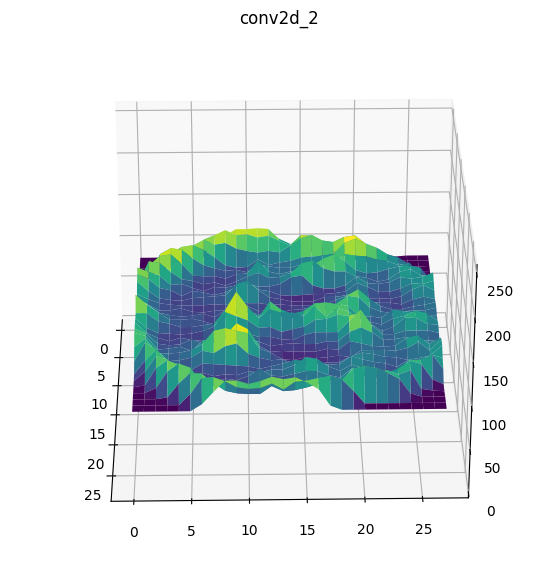

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 랜덤으로 테스트 이미지 선택
random_index = np.random.randint(0, X_test.shape[0])
test_image = X_test[random_index].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
activations = activation_model.predict(test_image)

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 마지막 레이어의 활성화 값 추출
layer_name, layer_activation = layer_names[-1], activations[-1]
n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

# 활성화 맵들을 겹쳐서 하나의 이미지를 만듭니다.
combined_image = np.zeros((size, size))

# 각 채널의 특징 맵을 겹쳐서 하나의 이미지로 만듭니다.
for i in range(n_features):
    channel_image = layer_activation[0, :, :, i]

    # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
    if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
        channel_image -= channel_image.mean()
        channel_image /= channel_image.std()

    # 이미지를 보기 좋게 조정
        channel_image *= 64
        channel_image += 128
        channel_image = np.clip(channel_image, 0, 255).astype('uint8')

    # 채널 이미지를 합산하여 겹침
    combined_image += channel_image

# 합산한 이미지를 보기 좋게 정규화
combined_image /= n_features
combined_image = np.clip(combined_image, 0, 255).astype('uint8')

# 3D 시각화를 위해 X, Y 좌표 생성
x = np.linspace(0, combined_image.shape[1] - 1, combined_image.shape[1])
y = np.linspace(0, combined_image.shape[0] - 1, combined_image.shape[0])
x, y = np.meshgrid(x, y)
z = combined_image

# 3D 시각화 및 애니메이션
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

def update(frame):
    ax.clear()
    ax.plot_surface(x, y, z, cmap='viridis')
    ax.view_init(elev=30, azim=frame)
    ax.set_title(layer_name)
    ax.set_zlim(0, 255)

ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 1), interval=50)

# 애니메이션 저장 및 실행
from matplotlib.animation import PillowWriter
ani.save("rotation_animation.gif", writer=PillowWriter(fps=20))

plt.show()


### conv2d_2 결과 모두 더한 결과 시각화

1/1 [==============================] - 0s 67ms/step


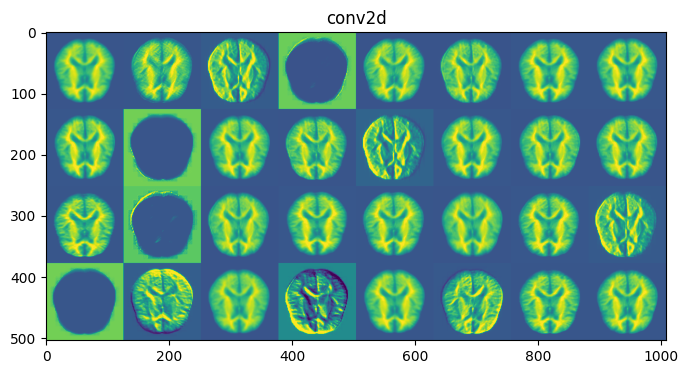

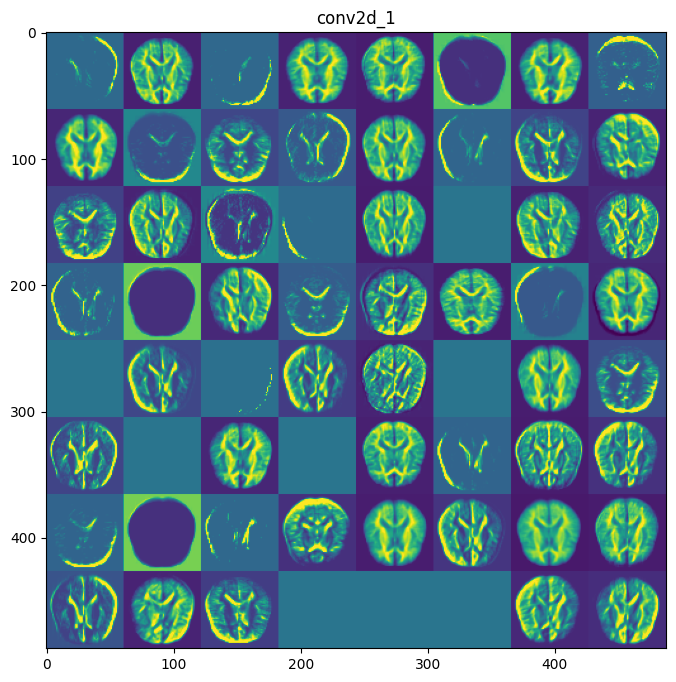

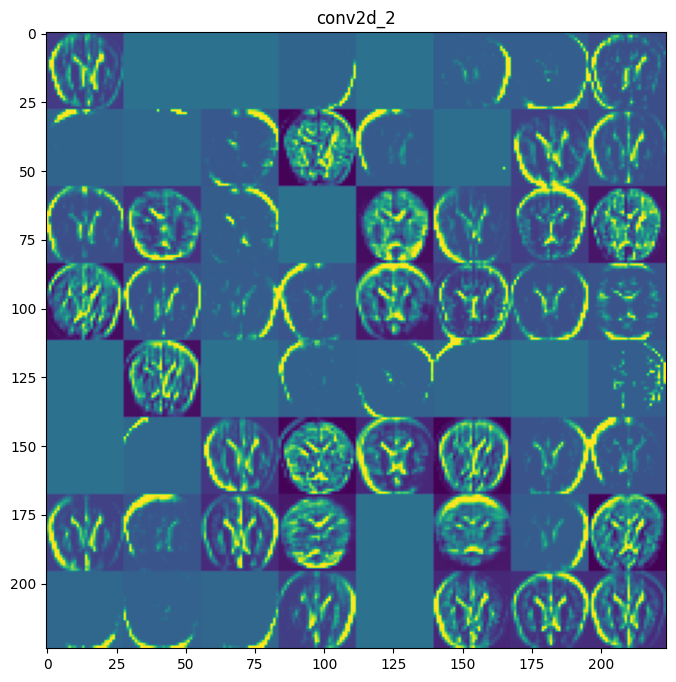

In [30]:
# 임의의 갯수 (조금만 더하기)

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 테스트 이미지 2개를 사용하여 각 레이어의 활성화 값(특징 맵)을 추출하고 합산
total_activations = None
num_images = 50  # 사용할 이미지 수

for i in range(num_images):
    test_image = X_test[i].reshape(1, 128, 128, 1)
    activations = activation_model.predict(test_image)

    if total_activations is None:
        total_activations = [np.zeros_like(activation) for activation in activations]

    for j in range(len(activations)):
        total_activations[j] += activations[j]

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 시각화에 사용될 이미지의 열 수를 정의합니다.
images_per_row = 8

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, total_activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 한 열당 특징 맵을 몇 개 배치할지 계산합니다.
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 채널의 특징 맵을 그리드에 배치합니다.
    for col in range(n_cols):
        for row in range(images_per_row):
            # 활성화 값에서 각 채널을 추출
            channel_image = layer_activation[0, :, :, col * images_per_row + row]

            # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
            if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()

            # 이미지를 보기 좋게 조정
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            # 정규화된 이미지를 그리드에 배치
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드의 크기를 맞추기 위한 스케일을 설정
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    
    # 레이어 이름을 제목으로 설정
    plt.title(layer_name)
    plt.grid(False)
    
    # 최종적으로 그리드를 시각화 (각 레이어의 특징 맵을 이미지로 표시)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()


1/1 [==============================] - 0s 62ms/step


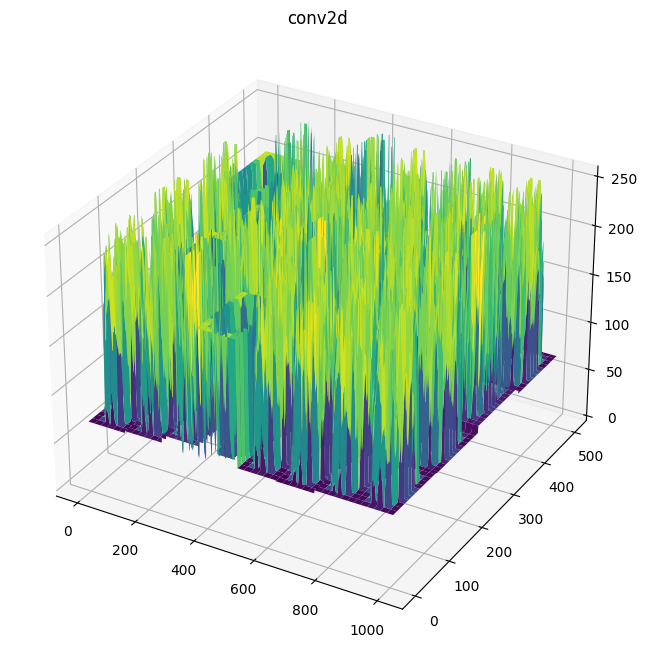

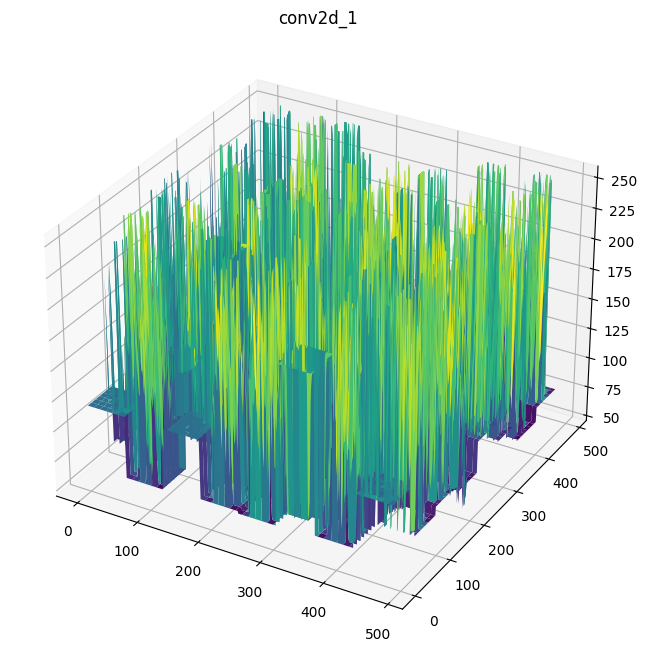

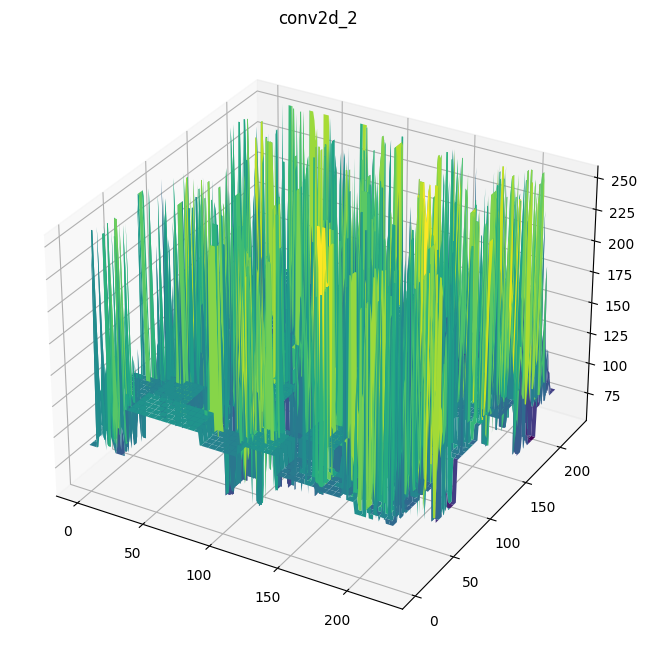

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 테스트 이미지 10개를 사용하여 각 레이어의 활성화 값(특징 맵)을 추출하고 합산
total_activations = None
num_images = 10  # 사용할 이미지 수

for i in range(num_images):
    test_image = X_test[i].reshape(1, 128, 128, 1)
    activations = activation_model.predict(test_image)

    if total_activations is None:
        total_activations = [np.zeros_like(activation) for activation in activations]

    for j in range(len(activations)):
        total_activations[j] += activations[j]

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 시각화에 사용될 이미지의 열 수를 정의합니다.
images_per_row = 8

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, total_activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 한 열당 특징 맵을 몇 개 배치할지 계산합니다.
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 채널의 특징 맵을 그리드에 배치합니다.
    for col in range(n_cols):
        for row in range(images_per_row):
            # 활성화 값에서 각 채널을 추출
            channel_image = layer_activation[0, :, :, col * images_per_row + row]

            # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
            if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()

            # 이미지를 보기 좋게 조정
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            # 정규화된 이미지를 그리드에 배치
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 3D 시각화를 위해 X, Y 좌표 생성
    x = np.linspace(0, display_grid.shape[1] - 1, display_grid.shape[1])
    y = np.linspace(0, display_grid.shape[0] - 1, display_grid.shape[0])
    x, y = np.meshgrid(x, y)
    z = display_grid

    # 3D 시각화
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # 높낮이를 주어 3D로 시각화
    ax.plot_surface(x, y, z, cmap='viridis')

    # 레이어 이름을 제목으로 설정
    ax.set_title(layer_name)
    plt.show()


In [26]:
# 이미지 평균 

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 테스트 이미지 전체를 사용하여 각 레이어의 활성화 값(특징 맵)을 추출하고 합산
total_activations = None

for i in range(len(X_test)):
    test_image = X_test[i].reshape(1, 128, 128, 1)
    activations = activation_model.predict(test_image)

    if total_activations is None:
        total_activations = [np.zeros_like(activation) for activation in activations]

    for j in range(len(activations)):
        total_activations[j] += activations[j]

# 각 레이어의 이름을 추출하여 시각화에 사용합니다.
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]

# 시각화에 사용될 이미지의 열 수를 정의합니다.
images_per_row = 8

# 각 레이어의 활성화 값을 시각화합니다.
for layer_name, layer_activation in zip(layer_names, total_activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수 (채널 수)
    size = layer_activation.shape[1]  # 특징 맵의 크기 (height, width가 동일하다고 가정)

    # 한 열당 특징 맵을 몇 개 배치할지 계산합니다.
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 채널의 특징 맵을 그리드에 배치합니다.
    for col in range(n_cols):
        for row in range(images_per_row):
            # 활성화 값에서 각 채널을 추출
            channel_image = layer_activation[0, :, :, col * images_per_row + row]

            # 채널 이미지의 표준화: 평균을 빼고, 표준편차로 나눠서 정규화
            if channel_image.std() != 0:  # 표준편차가 0이 아닌 경우에만 정규화
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()

            # 이미지를 보기 좋게 조정
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            # 정규화된 이미지를 그리드에 배치
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드의 크기를 맞추기 위한 스케일을 설정
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    
    # 레이어 이름을 제목으로 설정
    plt.title(layer_name)
    plt.grid(False)
    
    # 최종적으로 그리드를 시각화 (각 레이어의 특징 맵을 이미지로 표시)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()




1/1 [==============================] - 0s 81ms/step


1/1 [==============================] - 0s 46ms/step


KeyboardInterrupt: 

Weight shape: (3, 3, 1, 32)


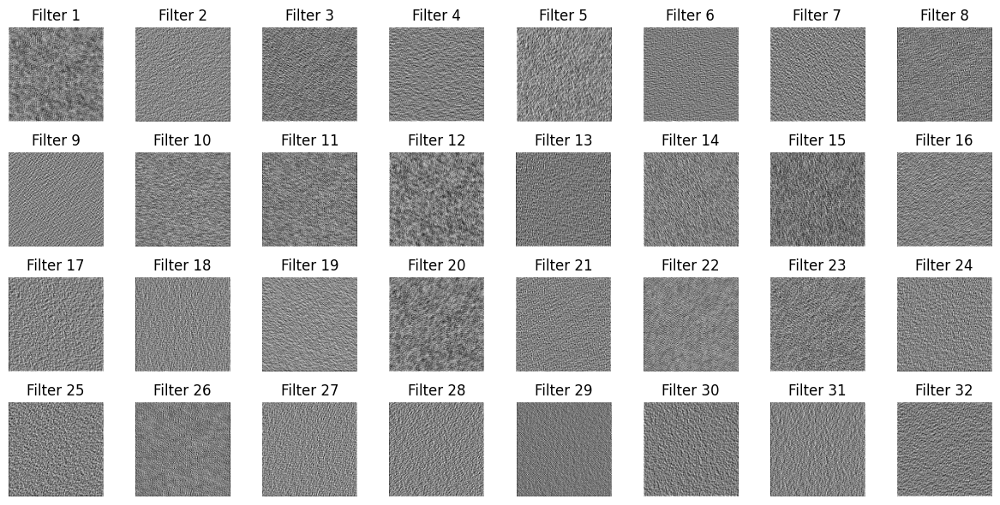

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def apply_filter_to_input(input_image, model):
    # 첫 번째 Convolutional 레이어의 가중치 추출
    first_conv_layer = model.layers[0]
    filters, biases = first_conv_layer.get_weights()
    
    # 가중치의 형태 확인 (커널 높이, 커널 너비, 입력 채널 수, 출력 채널 수)
    print(f"Weight shape: {filters.shape}")

    # 입력 이미지에 첫 번째 레이어의 각 필터 적용
    num_filters = filters.shape[-1]
    fig, axes = plt.subplots(4, 8, figsize=(12, 6))
    axes = axes.flatten()
    
    for i in range(num_filters):
        if i >= len(axes):
            break
        # 필터 추출
        filter_weights = filters[:, :, 0, i]  # 첫 번째 입력 채널의 가중치 사용
        # 필터를 입력 이미지에 적용
        filtered_image = tf.nn.conv2d(input_image[np.newaxis, :, :, np.newaxis], 
                                      filter_weights[:, :, np.newaxis, np.newaxis], 
                                      strides=[1, 1, 1, 1], 
                                      padding='SAME')[0, :, :, 0].numpy()
        
        axes[i].imshow(filtered_image, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"Filter {i+1}")

    plt.tight_layout()
    plt.show()

# 예시 입력 이미지 생성 (128x128)
input_image = np.random.rand(128, 128)

# 모델 생성 및 학습 (이전 코드의 모델 생성 및 학습 부분)

# 입력 이미지에 필터 적용 후 시각화
apply_filter_to_input(input_image, model)

1/1 [==============================] - 0s 43ms/step
Feature maps shape: (1, 30, 30, 64)


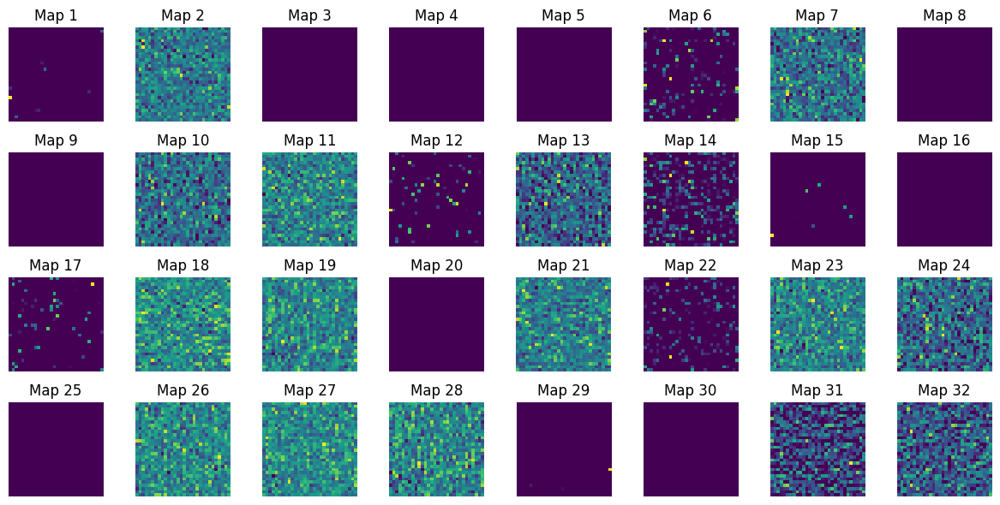

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def visualize_feature_maps(input_image, model, layer_index):
    # 모델의 입력과 중간 레이어의 출력을 이용해 새로운 모델 생성
    intermediate_model = Model(inputs=model.input, outputs=model.layers[layer_index].output)

    # 입력 이미지를 네트워크에 통과시켜 특징 맵 추출
    feature_maps = intermediate_model.predict(input_image[np.newaxis, :, :, np.newaxis])
    
    # 특징 맵의 형태 확인 (배치 크기, 높이, 너비, 필터 수)
    print(f"Feature maps shape: {feature_maps.shape}")

    # 특징 맵 시각화
    num_filters = feature_maps.shape[-1]
    size = feature_maps.shape[1]
    fig, axes = plt.subplots(4, 8, figsize=(12, 6))
    axes = axes.flatten()
    
    for i in range(num_filters):
        if i >= len(axes):
            break
        # 각 필터의 특징 맵을 시각화
        axes[i].imshow(feature_maps[0, :, :, i], cmap='viridis')
        axes[i].axis('off')
        axes[i].set_title(f"Map {i+1}")

    plt.tight_layout()
    plt.show()

# 예시 입력 이미지 생성 (128x128, 단일 채널)
input_image = np.random.rand(128, 128)

# 학습된 모델로부터 중간 레이어의 특징 맵을 시각화
# 예시로 2번째 Conv 레이어(모델에서 4번째 레이어, 인덱스 3)
visualize_feature_maps(input_image, model, layer_index=3)


1/1 [==============================] - 0s 52ms/step


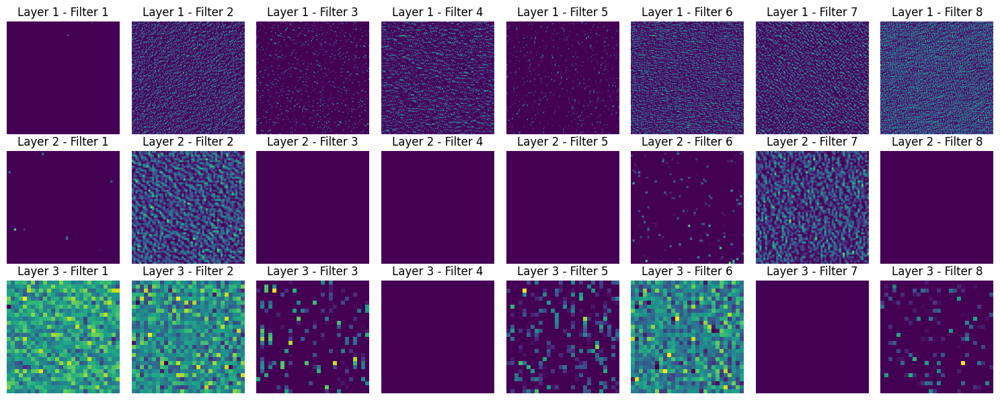

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def visualize_all_feature_maps(input_image, model):
    # 모델의 모든 Convolutional 레이어의 인덱스를 찾기
    conv_layers_indices = [i for i, layer in enumerate(model.layers) if isinstance(layer, layers.Conv2D)]
    
    # 입력 이미지를 네트워크에 통과시킬 모델을 생성 (각 Convolutional 레이어에서 출력 추출)
    layer_outputs = [model.layers[i].output for i in conv_layers_indices]
    intermediate_model = Model(inputs=model.input, outputs=layer_outputs)
    
    # 입력 이미지를 통과시켜 각 레이어의 특징 맵 추출
    feature_maps = intermediate_model.predict(input_image[np.newaxis, :, :, np.newaxis])
    
    # 특징 맵 시각화
    num_layers = len(conv_layers_indices)
    fig, axes = plt.subplots(num_layers, 8, figsize=(15, num_layers * 2))
    axes = axes.flatten()

    filter_num = 0  # 특징 맵 그리드에서 필터 번호를 위한 인덱스

    for layer_idx, feature_map in enumerate(feature_maps):
        num_filters = feature_map.shape[-1]
        for i in range(min(num_filters, 8)):  # 각 레이어의 최대 8개 필터를 시각화
            if filter_num >= len(axes):
                break
            ax = axes[filter_num]
            ax.imshow(feature_map[0, :, :, i], cmap='viridis')
            ax.axis('off')
            ax.set_title(f"Layer {layer_idx + 1} - Filter {i + 1}")
            filter_num += 1
    
    plt.tight_layout()
    plt.show()

# 예시 입력 이미지 생성 (128x128, 단일 채널)
input_image = np.random.rand(128, 128)

# 학습된 모델로부터 모든 Convolutional 레이어의 특징 맵을 시각화
visualize_all_feature_maps(input_image, model)


1/1 [==============================] - 0s 100ms/step


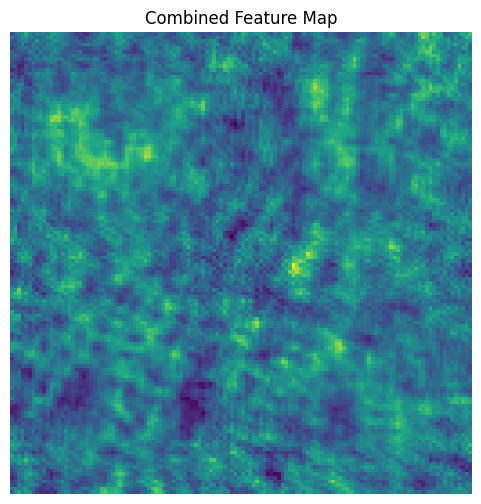

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers
import tensorflow as tf

def visualize_combined_feature_maps(input_image, model):
    # 모델의 모든 Convolutional 레이어의 인덱스를 찾기
    conv_layers_indices = [i for i, layer in enumerate(model.layers) if isinstance(layer, layers.Conv2D)]
    
    # 입력 이미지를 네트워크에 통과시킬 모델을 생성 (각 Convolutional 레이어에서 출력 추출)
    layer_outputs = [model.layers[i].output for i in conv_layers_indices]
    intermediate_model = Model(inputs=model.input, outputs=layer_outputs)
    
    # 입력 이미지를 통과시켜 각 레이어의 특징 맵 추출
    feature_maps = intermediate_model.predict(input_image[np.newaxis, :, :, np.newaxis])
    
    # 각 레이어의 특징 맵을 결합하여 하나의 이미지를 생성
    combined_feature_map = np.zeros((128, 128))

    for feature_map in feature_maps:
        # 각 레이어의 모든 필터를 평균하여 하나의 2D 맵으로 만듦
        averaged_feature_map = np.mean(feature_map[0], axis=-1)
        # 특징 맵을 128x128 크기로 리사이즈
        # averaged_feature_map을 3차원으로 변환 (높이, 너비, 1)
        averaged_feature_map_3d = np.expand_dims(averaged_feature_map, axis=-1)
        resized_feature_map = tf.image.resize(averaged_feature_map_3d, (128, 128)).numpy()
        resized_feature_map = np.squeeze(resized_feature_map)  # 다시 2D로 변환 (128, 128)
        # 리사이즈된 특징 맵을 합성
        combined_feature_map += resized_feature_map
    
    # 특징 맵을 정규화하여 0-1 범위로 스케일링
    combined_feature_map -= combined_feature_map.min()
    combined_feature_map /= combined_feature_map.max()

    # 최종 결합된 특징 맵을 시각화
    plt.figure(figsize=(6, 6))
    plt.imshow(combined_feature_map, cmap='viridis')
    plt.axis('off')
    plt.title("Combined Feature Map")
    plt.show()

# 예시 입력 이미지 생성 (128x128, 단일 채널)
input_image = np.random.rand(128, 128)

# 학습된 모델로부터 모든 Convolutional 레이어의 특징 맵을 결합하여 시각화
visualize_combined_feature_maps(input_image, model)


1/1 [==============================] - 0s 55ms/step


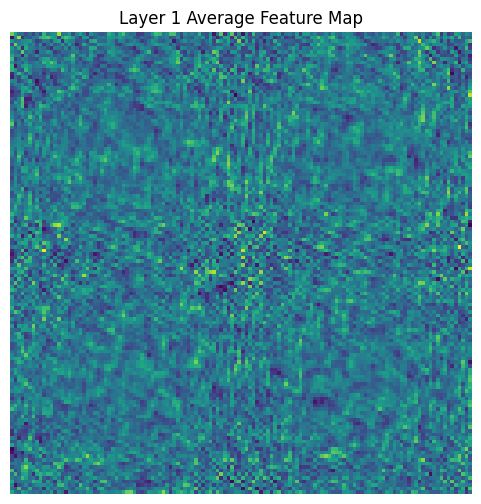

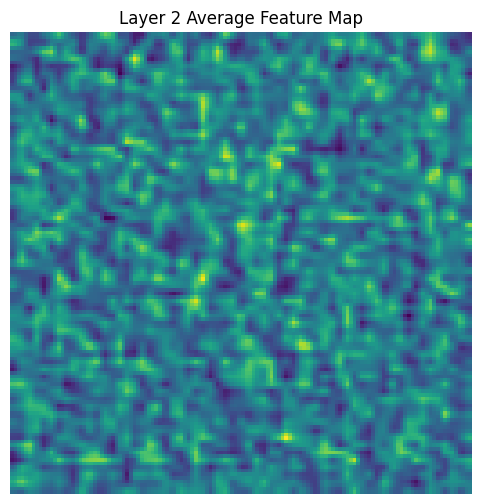

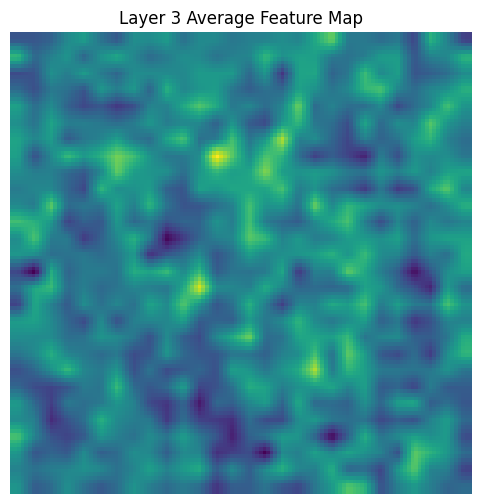

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers
import tensorflow as tf

def visualize_layerwise_feature_maps(input_image, model):
    # 모델의 모든 Convolutional 레이어의 인덱스를 찾기
    conv_layers_indices = [i for i, layer in enumerate(model.layers) if isinstance(layer, layers.Conv2D)]
    
    # 입력 이미지를 네트워크에 통과시킬 모델을 생성 (각 Convolutional 레이어에서 출력 추출)
    layer_outputs = [model.layers[i].output for i in conv_layers_indices]
    intermediate_model = Model(inputs=model.input, outputs=layer_outputs)
    
    # 입력 이미지를 통과시켜 각 레이어의 특징 맵 추출
    feature_maps = intermediate_model.predict(input_image[np.newaxis, :, :, np.newaxis])
    
    for layer_idx, feature_map in enumerate(feature_maps):
        # 각 레이어의 모든 필터를 평균하여 하나의 2D 맵으로 만듦
        averaged_feature_map = np.mean(feature_map[0], axis=-1)
        
        # 특징 맵을 128x128 크기로 리사이즈
        averaged_feature_map_3d = np.expand_dims(averaged_feature_map, axis=-1)
        resized_feature_map = tf.image.resize(averaged_feature_map_3d, (128, 128)).numpy()
        resized_feature_map = np.squeeze(resized_feature_map)  # 다시 2D로 변환 (128, 128)

        # 특징 맵을 정규화하여 0-1 범위로 스케일링
        resized_feature_map -= resized_feature_map.min()
        resized_feature_map /= resized_feature_map.max()
        
        # 각 레이어의 평균화된 특징 맵을 시각화
        plt.figure(figsize=(6, 6))
        plt.imshow(resized_feature_map, cmap='viridis')
        plt.axis('off')
        plt.title(f"Layer {layer_idx + 1} Average Feature Map")
        plt.show()

# 예시 입력 이미지 생성 (128x128, 단일 채널)
input_image = np.random.rand(128, 128)

# 학습된 모델로부터 각 레이어의 평균 특징 맵을 시각화
visualize_layerwise_feature_maps(input_image, model)


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 63, 63, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 28, 28, 64)        36928     
                                                                 
 flatten_4 (Flatten)         (None, 50176)            

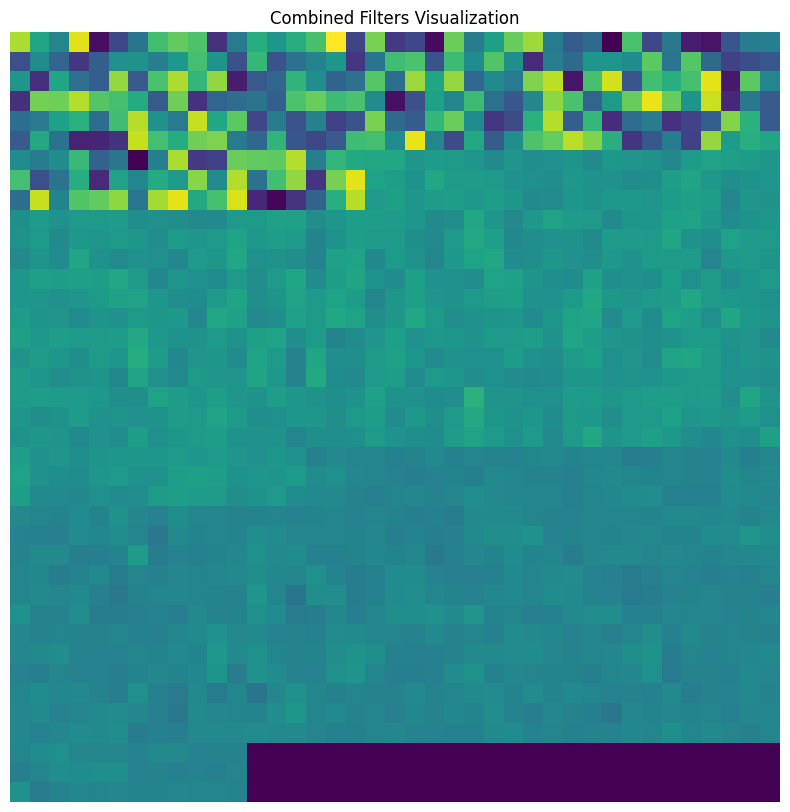

In [62]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras import layers

def visualize_filters_as_one_image(model):
    # 필터를 저장할 리스트 초기화
    all_filters = []
    
    # 모델의 각 Convolutional 레이어에서 가중치를 추출
    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            filters, biases = layer.get_weights()
            
            # 가중치 정규화
            f_min, f_max = filters.min(), filters.max()
            filters = (filters - f_min) / (f_max - f_min)
            
            # 필터의 개수와 형태 확인
            n_filters = filters.shape[-1]
            for i in range(n_filters):
                f = filters[:, :, :, i]
                # 필터의 모든 채널을 평균하여 시각화 (다채널 필터에 대한 간단한 접근)
                filter_image = np.mean(f, axis=-1)
                all_filters.append(filter_image)
    
    # 필터 이미지를 하나의 큰 이미지로 결합
    n_total_filters = len(all_filters)
    grid_size = int(np.ceil(np.sqrt(n_total_filters)))  # 그리드 크기 결정 (최소한의 정사각형 그리드)
    
    # 큰 이미지 크기 계산
    filter_height, filter_width = all_filters[0].shape
    combined_image = np.zeros((grid_size * filter_height, grid_size * filter_width))
    
    # 필터 이미지를 그리드에 배치
    for idx, filter_image in enumerate(all_filters):
        i = idx // grid_size
        j = idx % grid_size
        combined_image[i*filter_height:(i+1)*filter_height, j*filter_width:(j+1)*filter_width] = filter_image
    
    # 결합된 이미지 시각화
    plt.figure(figsize=(10, 10))
    plt.imshow(combined_image, cmap='viridis')
    plt.axis('off')
    plt.title("Combined Filters Visualization")
    plt.show()

# 모델 경로
model_path = r"C:\coding\VAE_best_model.h5"
model = load_model(model_path)
model.summary()

# 학습된 모델에서 필터 시각화 호출
visualize_filters_as_one_image(model)


1/1 [==============================] - 0s 54ms/step


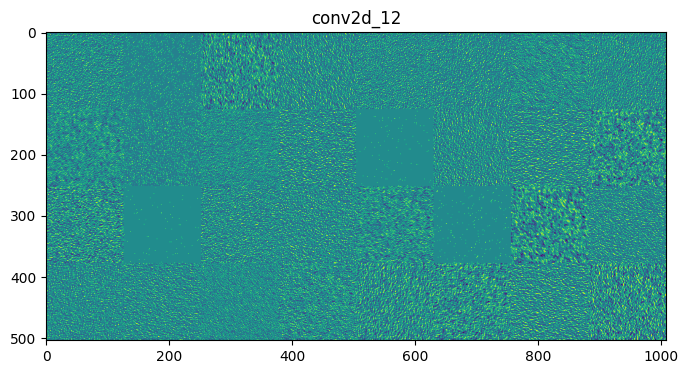

C:\Users\fu268\AppData\Local\Temp\ipykernel_26188\3669818790.py:32: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
C:\Users\fu268\AppData\Local\Temp\ipykernel_26188\3669818790.py:35: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


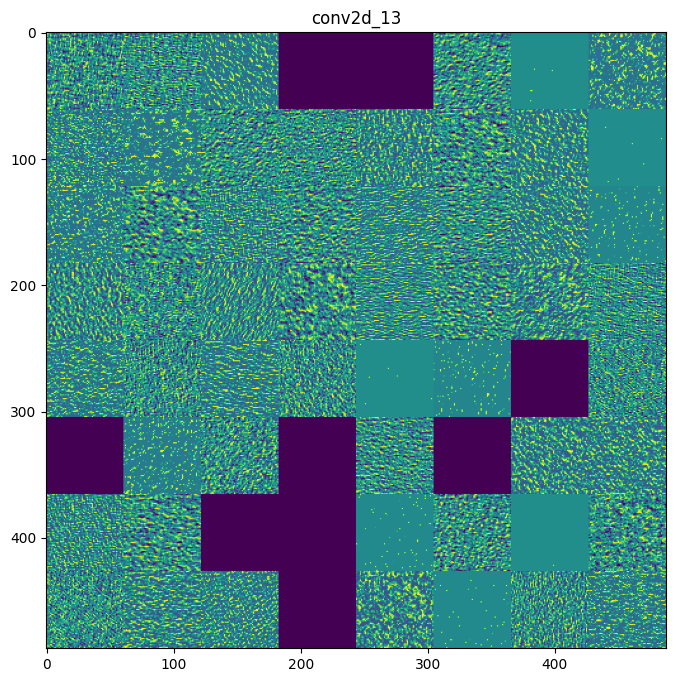

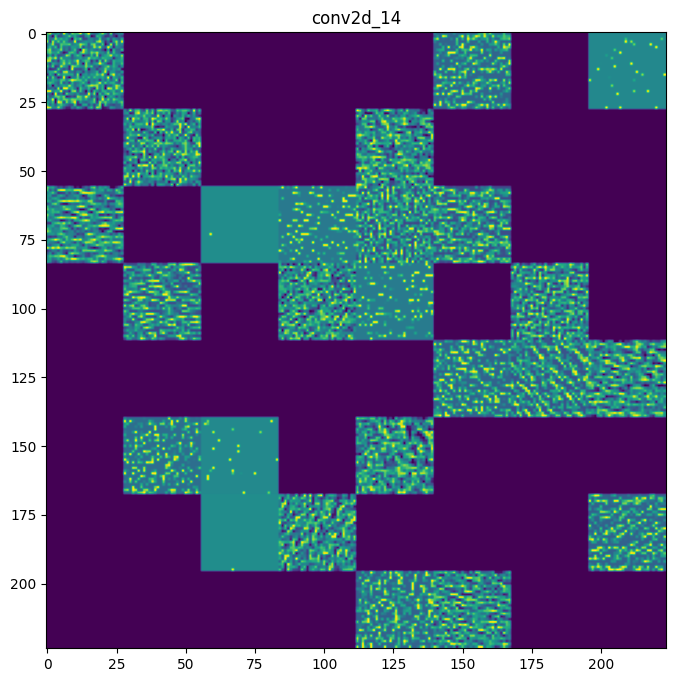

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras import layers

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 테스트 이미지 선택
random_index = np.random.randint(0, X_test.shape[0])
test_image = X_test[random_index].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
activations = activation_model.predict(test_image)

# 각 레이어의 특징 맵을 시각화
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]
images_per_row = 8

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수
    size = layer_activation.shape[1]  # 특징 맵의 크기

    n_cols = n_features // images_per_row  # 열의 수
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()


1/1 [==============================] - 0s 68ms/step


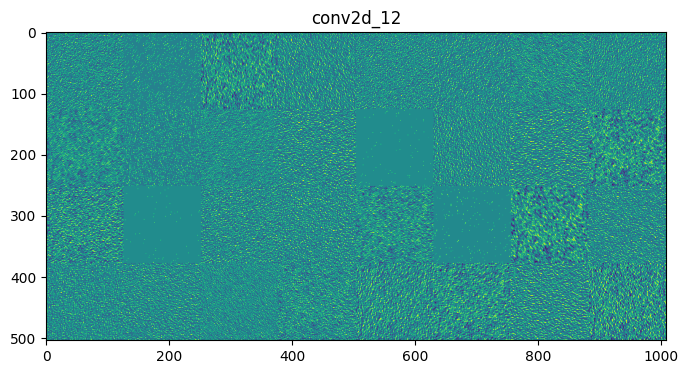

C:\Users\fu268\AppData\Local\Temp\ipykernel_26188\3411340603.py:44: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
C:\Users\fu268\AppData\Local\Temp\ipykernel_26188\3411340603.py:47: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


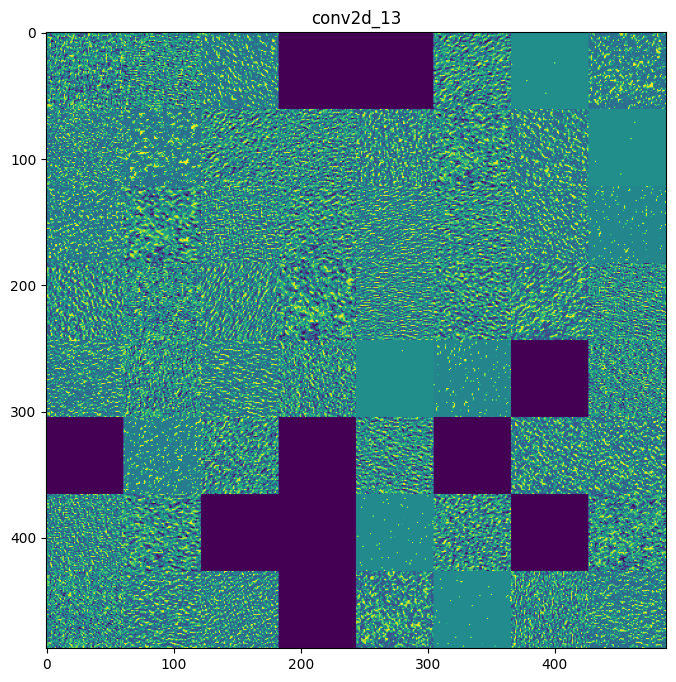

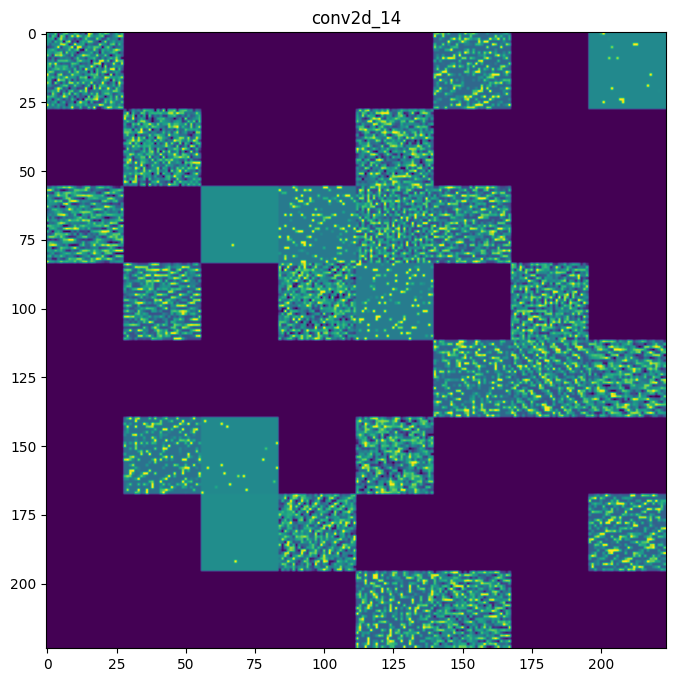

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers

# 모델 경로
model_path = "C:\\coding\\VAE_best_model.h5"

# 모델 로드
model = load_model(model_path)

# 테스트 이미지 (임시로 X_test라는 numpy 배열에서 첫 번째 이미지 사용)
# 실제 사용 시 적절한 테스트 이미지를 사용하세요.
# 여기서는 X_test를 미리 정의된 변수로 가정하고 사용합니다.
# X_test는 [samples, height, width, channels] 형태로 가정합니다.
X_test = np.random.random((10, 128, 128, 1))  # 예시용 데이터

# 중간 레이어의 출력값을 추출하는 모델 정의
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, layers.Conv2D)]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# 테스트 이미지 선택 (첫 번째 이미지 사용)
test_image = X_test[0].reshape(1, 128, 128, 1)

# 모델에 테스트 이미지를 통과시켜 각 레이어의 활성화 값(특징 맵) 추출
activations = activation_model.predict(test_image)

# 각 레이어의 특징 맵을 시각화
layer_names = [layer.name for layer in model.layers if isinstance(layer, layers.Conv2D)]
images_per_row = 8

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # 이 레이어의 특징 수
    size = layer_activation.shape[1]  # 특징 맵의 크기

    n_cols = n_features // images_per_row  # 열의 수
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()


In [43]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# CNN 모델 정의 함수
def create_model():
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(2, activation='softmax'))  # 2는 클래스의 개수에 따라 조절

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# 특징 맵 시각화 함수
def visualize_combined_feature_maps(input_image, model):
    # 모델의 모든 Convolutional 레이어의 인덱스를 찾기
    conv_layers_indices = [i for i, layer in enumerate(model.layers) if isinstance(layer, layers.Conv2D)]
    
    # 입력 이미지를 네트워크에 통과시킬 모델을 생성 (각 Convolutional 레이어에서 출력 추출)
    layer_outputs = [model.layers[i].output for i in conv_layers_indices]
    intermediate_model = Model(inputs=model.input, outputs=layer_outputs)
    
    # 입력 이미지를 통과시켜 각 레이어의 특징 맵 추출
    feature_maps = intermediate_model.predict(input_image[np.newaxis, :, :, np.newaxis])
    
    # 각 레이어의 특징 맵을 결합하여 하나의 이미지를 생성
    combined_feature_map = np.zeros((128, 128))

    for feature_map in feature_maps:
        # 각 레이어의 모든 필터를 평균하여 하나의 2D 맵으로 만듦
        averaged_feature_map = np.mean(feature_map[0], axis=-1)
        # 특징 맵을 128x128 크기로 리사이즈
        # averaged_feature_map을 3차원으로 변환 (높이, 너비, 1)
        averaged_feature_map_3d = np.expand_dims(averaged_feature_map, axis=-1)
        resized_feature_map = tf.image.resize(averaged_feature_map_3d, (128, 128)).numpy()
        resized_feature_map = np.squeeze(resized_feature_map)  # 다시 2D로 변환 (128, 128)
        # 리사이즈된 특징 맵을 합성
        combined_feature_map += resized_feature_map
    
    # 특징 맵을 정규화하여 0-1 범위로 스케일링
    combined_feature_map -= combined_feature_map.min()
    combined_feature_map /= combined_feature_map.max()

    # 최종 결합된 특징 맵을 시각화
    plt.figure(figsize=(6, 6))
    plt.imshow(combined_feature_map, cmap='viridis')
    plt.axis('off')
    plt.title("Combined Feature Map")
    plt.show()

# 초기 설정
max_epochs = 15
batch_size = 32
target_f1_score = 0.99
repetition_count = 0
f1_scores = []

# 데이터셋 로드 (사용자의 X_train, y_train, X_test, y_test가 이미 존재한다고 가정)
# X_train, y_train, X_test, y_test는 사용자 데이터셋에 따라 정의되어 있어야 합니다.
# 예시로, X_train, y_train, X_test, y_test = load_data() 와 같은 부분이 필요합니다.

# 반복 학습
while True:
    repetition_count += 1
    print(f"Repetition: {repetition_count}")

    # 모델 생성 및 학습
    model = create_model()
    history = model.fit(X_train, y_train, epochs=max_epochs, batch_size=batch_size, validation_split=0.2)

    # 테스트 데이터 예측
    y_pred_test = model.predict(X_test)

    # 테스트 데이터에 대한 예측값에서 가장 높은 확률의 클래스를 추출
    y_pred_test_labels = np.argmax(y_pred_test, axis=1)
    y_true_test_labels = np.argmax(y_test, axis=1)

    # F1 Score 계산
    f1 = f1_score(y_true_test_labels, y_pred_test_labels, average='weighted')
    f1_scores.append(f1)

    print(f"F1 Score: {f1}")

    # 목표 F1 Score 도달 시 모델 저장 및 종료
    if f1 >= target_f1_score:
        model.save('VAE_best_model.h5')
        print(f"Model saved after {repetition_count} repetitions with F1 Score: {f1}")
        break

# 반복 횟수와 F1 Scores 출력
print(f"Total repetitions: {repetition_count}")
print(f"All F1 Scores: {f1_scores}")

# 예시 입력 이미지 생성 (128x128, 단일 채널)
input_image = np.random.rand(128, 128)

# 학습된 모델로부터 모든 Convolutional 레이어의 특징 맵을 결합하여 시각화
visualize_combined_feature_maps(input_image, model)


Repetition: 1
Epoch 1/15
30/82 [=========>....................] - ETA: 10s - loss: 0.5700 - accuracy: 0.7823

KeyboardInterrupt: 

In [27]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    return image

# 이미지 분류 함수
def classify_image(model, image_path):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    image = preprocess_image(image_path, target_size)
    reconstructed = model.predict(image)
    
    # 원본 이미지와 재구성된 이미지 간의 차이를 계산
    mse = np.mean(np.square(image - reconstructed))
    
    # 여기서는 단순히 MSE 값으로 정상과 경증을 분류
    threshold = 0.01  # 임의의 임계값 설정, 필요에 따라 조정
    if mse < threshold:
        return "정상"
    else:
        return "경증"

# 이미지가 있는 디렉토리 경로
image_directory = "./경증_123d"

# 디렉토리 내 모든 파일에 대해 분류 수행
for filename in os.listdir(image_directory):
    if filename.endswith((".png", ".jpg", ".jpeg")):
        image_path = os.path.join(image_directory, filename)
        result = classify_image(model, image_path)
        print(f"Image: {filename}, Classification: {result}")


1/1 [==============================] - 0s 290ms/step
Image: combined_non_1088.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non.jpg, Classification: 경증
1/1 [==============================] - 0s 46ms/step
Image: combined_non_1342.jpg, Classification: 경증
1/1 [==============================] - 0s 48ms/step
Image: combined_non_1050.jpg, Classification: 경증
1/1 [==============================] - 0s 48ms/step
Image: combined_non_1534.jpg, Classification: 경증
1/1 [==============================] - 0s 47ms/step
Image: combined_non_1633.jpg, Classification: 경증
1/1 [==============================] - 0s 46ms/step
Image: combined_non_126.jpg, Classification: 경증
1/1 [==============================] - 0s 54ms/step
Image: combined_non_1454.jpg, Classification: 경증
1/1 [==============================] - 0s 51ms/step
Image: combined_non_1178.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non_1189.jpg, Classification

1/1 [==============================] - 0s 53ms/step
Image: combined_non_1509.jpg, Classification: 경증
1/1 [==============================] - 0s 53ms/step
Image: combined_non_1554.jpg, Classification: 경증
1/1 [==============================] - 0s 52ms/step
Image: combined_non_1179.jpg, Classification: 경증
1/1 [==============================] - 0s 51ms/step
Image: combined_non_1284.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non_1715.jpg, Classification: 경증
1/1 [==============================] - 0s 52ms/step
Image: combined_non_1817.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non_1080.jpg, Classification: 경증
1/1 [==============================] - 0s 51ms/step
Image: combined_non_1480.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1751.jpg, Classification: 경증
1/1 [==============================] - 0s 51ms/step
Image: combined_non_1352.jpg, Classific

1/1 [==============================] - 0s 49ms/step
Image: combined_non_1550.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1544.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1545.jpg, Classification: 경증
1/1 [==============================] - 0s 53ms/step
Image: combined_non_1068.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non_1431.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1785.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1652.jpg, Classification: 경증
1/1 [==============================] - 0s 50ms/step
Image: combined_non_133.jpg, Classification: 경증
1/1 [==============================] - 0s 49ms/step
Image: combined_non_1006.jpg, Classification: 경증
1/1 [==============================] - 0s 48ms/step
Image: combined_non_1071.jpg, Classifica

KeyboardInterrupt: 

In [31]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)  # 배치 차원 추가
    return image

# 여러 이미지 전처리 함수
def preprocess_images(image_paths, target_size):
    images = []
    for image_path in image_paths:
        image = preprocess_image(image_path, target_size)
        images.append(image)
    images = np.vstack(images)  # 배치 차원을 추가하여 하나의 배열로 묶음
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 클래스 확률을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 이미지가 있는 디렉토리 경로
image_directory = "./경증_123d"

# 디렉토리 내 모든 이미지 파일 경로 리스트
image_paths = [os.path.join(image_directory, filename) for filename in os.listdir(image_directory) if filename.endswith((".png", ".jpg", ".jpeg"))]

# 배치 크기 설정
batch_size = 32
num_batches = len(image_paths) // batch_size + (1 if len(image_paths) % batch_size != 0 else 0)

# 배치 단위로 분류 수행
for i in range(num_batches):
    batch_paths = image_paths[i * batch_size:(i + 1) * batch_size]
    results = classify_images(model, batch_paths)
    for image_path, result in zip(batch_paths, results):
        print(f"Image: {os.path.basename(image_path)}, Classification: {result}")


1/1 [==============================] - 0s 285ms/step
Image: combined_non_1088.jpg, Classification: 정상
Image: combined_non.jpg, Classification: 정상
Image: combined_non_1342.jpg, Classification: 정상
Image: combined_non_1050.jpg, Classification: 정상
Image: combined_non_1534.jpg, Classification: 정상
Image: combined_non_1633.jpg, Classification: 정상
Image: combined_non_126.jpg, Classification: 정상
Image: combined_non_1454.jpg, Classification: 정상
Image: combined_non_1178.jpg, Classification: 정상
Image: combined_non_1189.jpg, Classification: 정상
Image: combined_non_1564.jpg, Classification: 경증
Image: combined_non_1181.jpg, Classification: 정상
Image: combined_non_1699.jpg, Classification: 정상
Image: combined_non_1604.jpg, Classification: 정상
Image: combined_non_1451.jpg, Classification: 정상
Image: combined_non_1322.jpg, Classification: 정상
Image: combined_non_1747.jpg, Classification: 정상
Image: combined_non_1762.jpg, Classification: 정상
Image: combined_non_1529.jpg, Classification: 정상
Image: combined_non_10

1/1 [==============================] - 0s 60ms/step
Image: combined_non_1215.jpg, Classification: 정상
Image: combined_non_1570.jpg, Classification: 정상
Image: combined_non_1509.jpg, Classification: 정상
Image: combined_non_1554.jpg, Classification: 정상
Image: combined_non_1179.jpg, Classification: 정상
Image: combined_non_1284.jpg, Classification: 정상
Image: combined_non_1715.jpg, Classification: 정상
Image: combined_non_1817.jpg, Classification: 정상
Image: combined_non_1080.jpg, Classification: 정상
Image: combined_non_1480.jpg, Classification: 정상
Image: combined_non_1751.jpg, Classification: 정상
Image: combined_non_1352.jpg, Classification: 정상
Image: combined_non_1332.jpg, Classification: 정상
Image: combined_non_1563.jpg, Classification: 정상
Image: combined_non_1141.jpg, Classification: 정상
Image: combined_non_14.jpg, Classification: 정상
Image: combined_non_101.jpg, Classification: 정상
Image: combined_non_1212.jpg, Classification: 정상
Image: combined_non_1219.jpg, Classification: 정상
Image: combined_non_

1/1 [==============================] - 0s 52ms/step
Image: combined_non_1496.jpg, Classification: 정상
Image: combined_non_1491.jpg, Classification: 정상
Image: combined_non_1686.jpg, Classification: 정상
Image: combined_non_1402.jpg, Classification: 정상
Image: combined_non_1049.jpg, Classification: 경증
Image: combined_non_1483.jpg, Classification: 정상
Image: combined_non_148.jpg, Classification: 정상
Image: combined_non_132.jpg, Classification: 정상
Image: combined_non_1140.jpg, Classification: 정상
Image: combined_non_1448.jpg, Classification: 정상
Image: combined_non_1394.jpg, Classification: 정상
Image: combined_non_1377.jpg, Classification: 정상
Image: combined_non_145.jpg, Classification: 정상
Image: combined_non_1128.jpg, Classification: 정상
Image: combined_non_1637.jpg, Classification: 정상
Image: combined_non_1576.jpg, Classification: 정상
Image: combined_non_1193.jpg, Classification: 정상
Image: combined_non_1450.jpg, Classification: 정상
Image: combined_non_1441.jpg, Classification: 정상
Image: combined_non_

1/1 [==============================] - 0s 56ms/step
Image: combined_non_1270.jpg, Classification: 정상
Image: combined_non_1158.jpg, Classification: 정상
Image: combined_non_1608.jpg, Classification: 정상
Image: combined_non_1672.jpg, Classification: 정상
Image: combined_non_1417.jpg, Classification: 정상
Image: combined_non_1606.jpg, Classification: 정상
Image: combined_non_178.jpg, Classification: 정상
Image: combined_non_1376.jpg, Classification: 정상
Image: combined_non_1741.jpg, Classification: 정상
Image: combined_non_1396.jpg, Classification: 정상
Image: combined_non_1636.jpg, Classification: 정상
Image: combined_non_1766.jpg, Classification: 정상
Image: combined_non_1127.jpg, Classification: 정상
Image: combined_non_1663.jpg, Classification: 정상
Image: combined_non_1571.jpg, Classification: 정상
Image: combined_non_1223.jpg, Classification: 정상
Image: combined_non_1123.jpg, Classification: 정상
Image: combined_non_1090.jpg, Classification: 정상
Image: combined_non_1478.jpg, Classification: 정상
Image: combined_no

In [46]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 이미지가 있는 디렉토리 경로
image_directory = "./경증_a234"

# 디렉토리 내 모든 파일에 대해 분류 수행
image_paths = [os.path.join(image_directory, filename) for filename in os.listdir(image_directory) if filename.endswith((".png", ".jpg", ".jpeg"))]
results = classify_images(model, image_paths)

# 분류 결과 출력 및 통계 계산
normal_count = results.count("정상")
mild_count = results.count("경증")

for image_path, result in zip(image_paths, results):
    print(f"Image: {os.path.basename(image_path)}, Classification: {result}")

print(f"\nTotal Normal: {normal_count}, Total Mild: {mild_count}")


20/20 [==============================] - 0s 5ms/step
Image: combined_non_1088.jpg, Classification: 정상
Image: combined_non.jpg, Classification: 정상
Image: combined_non_1342.jpg, Classification: 정상
Image: combined_non_1050.jpg, Classification: 정상
Image: combined_non_1534.jpg, Classification: 정상
Image: combined_non_1633.jpg, Classification: 정상
Image: combined_non_126.jpg, Classification: 정상
Image: combined_non_1454.jpg, Classification: 정상
Image: combined_non_1178.jpg, Classification: 정상
Image: combined_non_1189.jpg, Classification: 경증
Image: combined_non_1564.jpg, Classification: 정상
Image: combined_non_1181.jpg, Classification: 정상
Image: combined_non_1699.jpg, Classification: 정상
Image: combined_non_1604.jpg, Classification: 정상
Image: combined_non_1451.jpg, Classification: 정상
Image: combined_non_1322.jpg, Classification: 정상
Image: combined_non_1747.jpg, Classification: 정상
Image: combined_non_1762.jpg, Classification: 경증
Image: combined_non_1529.jpg, Classification: 정상
Image: combined_non_10

./경증_a234
- Total Normal: 557, Total Mild: 70

./경증_1b34
- Total Normal: 525, Total Mild: 102


./경증_12c4
- Total Normal: 602, Total Mild: 25


./경증_123d
- Total Normal: 599, Total Mild: 28

예상 값 = 어느 한 부분에서 모든 이미지가 경증, 또는 정상으로 나뉠 줄 알았음

실제 = 어떤 이미지는 정상, 어떤 이미지는 경증으로 나옴.

## 0. 경증 부분 찾기1

뇌의 4개로 나눈 것 중 1부분만 나누어서 결과가 잘 나오지 않은 것으로 생각 -> 2개씩 바꿔서 생성함

In [50]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 디렉토리 목록
directories = [
    "경증_ab34",
    "경증_a2c4",
    "경증_a23d",
    "경증_1bc4",
    "경증_1b3d",
    "경증_12cd"
]

# 각 디렉토리 내 모든 파일에 대해 분류 수행
for directory in directories:
    image_directory = f"./{directory}"
    image_paths = [os.path.join(image_directory, filename) for filename in os.listdir(image_directory) if filename.endswith((".png", ".jpg", ".jpeg"))]
    
    results = classify_images(model, image_paths)
    
    # 분류 결과 출력 및 통계 계산
    normal_count = results.count("정상")
    mild_count = results.count("경증")
    
    print(f"Directory: {directory}")
    print(f"Total Normal: {normal_count}, Total Mild: {mild_count}\n")


20/20 [==============================] - 0s 5ms/step
Directory: 경증_ab34
Total Normal: 295, Total Mild: 332

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a2c4
Total Normal: 473, Total Mild: 154

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a23d
Total Normal: 444, Total Mild: 183

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1bc4
Total Normal: 395, Total Mild: 232

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1b3d
Total Normal: 425, Total Mild: 202

20/20 [==============================] - 0s 5ms/step
Directory: 경증_12cd
Total Normal: 502, Total Mild: 125




경증_ab34
- Total Normal: 295, Total Mild: 332

경증_a2c4
- Total Normal: 473, Total Mild: 154

경증_a23d
- Total Normal: 444, Total Mild: 183

경증_1bc4
- Total Normal: 395, Total Mild: 232

경증_1b3d
- Total Normal: 425, Total Mild: 202

경증_12cd
- Total Normal: 502, Total Mild: 125

2개씩 나누어서 보아도 별다른 분류가 되지 않아 경증 부분 3개 정상 부분 1개로 하여 결과를 보려고 함.

## 1. 경증 부분 찾기1.2

In [54]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 이미지가 있는 디렉토리 경로
image_directory = "./경증_abc4"

# 디렉토리 내 모든 파일에 대해 분류 수행
image_paths = [os.path.join(image_directory, filename) for filename in os.listdir(image_directory) if filename.endswith((".png", ".jpg", ".jpeg"))]
results = classify_images(model, image_paths)

# 분류 결과 출력 및 통계 계산
normal_count = results.count("정상")
mild_count = results.count("경증")

for image_path, result in zip(image_paths, results):
    print(f"Image: {os.path.basename(image_path)}, Classification: {result}")

print(f"\nTotal Normal: {normal_count}, Total Mild: {mild_count}")


20/20 [==============================] - 0s 5ms/step
Image: combined_non_1088.jpg, Classification: 경증
Image: combined_non.jpg, Classification: 정상
Image: combined_non_1342.jpg, Classification: 경증
Image: combined_non_1050.jpg, Classification: 정상
Image: combined_non_1534.jpg, Classification: 경증
Image: combined_non_1633.jpg, Classification: 정상
Image: combined_non_126.jpg, Classification: 경증
Image: combined_non_1454.jpg, Classification: 경증
Image: combined_non_1178.jpg, Classification: 경증
Image: combined_non_1189.jpg, Classification: 경증
Image: combined_non_1564.jpg, Classification: 경증
Image: combined_non_1181.jpg, Classification: 경증
Image: combined_non_1699.jpg, Classification: 경증
Image: combined_non_1604.jpg, Classification: 경증
Image: combined_non_1451.jpg, Classification: 경증
Image: combined_non_1322.jpg, Classification: 경증
Image: combined_non_1747.jpg, Classification: 경증
Image: combined_non_1762.jpg, Classification: 경증
Image: combined_non_1529.jpg, Classification: 경증
Image: combined_non_10

경증_1bcd
- Total Normal: 250, Total Mild: 377

경증_a2cd
- Total Normal: 257, Total Mild: 370

경증_ab3d
- Total Normal: 126, Total Mild: 501

경증_abc4
- Total Normal: 144, Total Mild: 483

## 여기까지의 결과 해석

대체적으로 어느 부분에서 딱 정상 혹은 비정상으로 나뉘지는 않았음.

그러나 b 부분(경증에서 오른쪽 위)을 바꾼 곳에서 100개 이상을 다른 파일에 비해 Mild라고 분류한 값이 많음.

## 2. 경증 부분 찾기 2

16등분을 해서 결과들 확인 

1. 1부분만 바꿔서 확인
2. 2부분만 바꿔서 확인
3. ...
4. 15부분만 바꿔서 확인

In [67]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 패턴을 포함하는 디렉토리 분류 함수
def classify_directories_with_pattern(base_directory, pattern):
    # base_directory 내의 모든 디렉토리 목록 가져오기
    directories = [d for d in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, d))]
    
    for directory in directories:
        if pattern in directory:
            dir_path = os.path.join(base_directory, directory)
            image_paths = [os.path.join(dir_path, filename) for filename in os.listdir(dir_path) if filename.endswith((".png", ".jpg", ".jpeg"))]
            
            if not image_paths:
                continue
            
            results = classify_images(model, image_paths)
            
            # 분류 결과 출력 및 통계 계산
            normal_count = results.count("정상")
            mild_count = results.count("경증")
            
            print(f"Directory: {directory}")
            print(f"Total Normal: {normal_count}, Total Mild: {mild_count}\n")

if __name__ == "__main__":
    base_directory = '.'  # 생성된 디렉토리가 위치한 기본 디렉토리
    pattern = '경증'  # 분류할 디렉토리 이름의 패턴
    
    classify_directories_with_pattern(base_directory, pattern)


20/20 [==============================] - 0s 5ms/step
Directory: 경증_a2345678a10111213141516
Total Normal: 624, Total Mild: 3

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1a34567891011a13141516
Total Normal: 606, Total Mild: 21

20/20 [==============================] - 0s 5ms/step
Directory: 경증_123456a8910111213a1516
Total Normal: 570, Total Mild: 57

20/20 [==============================] - 0s 5ms/step
Directory: 경증_12345678910a121314a16
Total Normal: 613, Total Mild: 14

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a2a45678910111213141516
Total Normal: 624, Total Mild: 3

20/20 [==============================] - 0s 6ms/step
Directory: 경증_123a5678a10111213141516
Total Normal: 624, Total Mild: 3

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1a3456789101112131415a
Total Normal: 621, Total Mild: 6

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a23456789101112a141516
Total Normal: 626, Total Mild: 1

20/

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1234567891011a131415a
Total Normal: 619, Total Mild: 8

20/20 [==============================] - 0s 5ms/step
Directory: 경증_123456a89101112a141516
Total Normal: 568, Total Mild: 59

20/20 [==============================] - 0s 5ms/step
Directory: 경증_123a5678910a1213141516
Total Normal: 618, Total Mild: 9

20/20 [==============================] - 0s 5ms/step
Directory: 경증_1234aa78910111213141516
Total Normal: 610, Total Mild: 17

20/20 [==============================] - 0s 5ms/step
Directory: 경증_12345a78910111213a1516
Total Normal: 619, Total Mild: 8

20/20 [==============================] - 0s 5ms/step
Directory: 경증_12345a789a111213141516
Total Normal: 577, Total Mild: 50

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a2345a78910111213141516
Total Normal: 621, Total Mild: 6

20/20 [==============================] - 0s 5ms/step
Directory: 경증_a2345678910a1213141516
Total Normal: 617, Total Mild: 10

20/

#### 결과 해석

16등분을 한 결과를 가지고 분류를 돌렸을 때, 7번째를 바꾼 결과가 가장 좋았고, 

추가적으로 2가지를 바꾸었을 당시에 Mild가 70 이상으로 나온 이미지들을 봤을 때 7번째 부분을 중심으로 Mild 비율이 높았음.

마지막으로 7번을 중심으로 값이 좋아진 경우는 
1(71), 2(87), 5(83), 6(107), 8(92), 10(140), 11(90), 12(101), 15(71)


Mild라고 분류가 많은 순
10(140), 6(107), 12(101), 8(92), 11(90), 2(87), 5(83), 1(71)-15(71)

Mild라고 생각이 되어지는 부분만 값을 넣어줌.


[00,02,00,00]

[00,06,07,08]

[00,10,11,12]

[00,00,00,00]




[00,00,00,00]

[00,06,07,00]

[00,10,00,12]

[00,00,00,00]


### 따라서 밑의 코드에서 중요 부분을 가지고 만들 수 있는 모든 집합으로 생성된 이미지를 분류 


In [72]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 패턴을 포함하는 디렉토리 분류 함수
def classify_directories_with_pattern(base_directory, pattern):
    # base_directory 내의 모든 디렉토리 목록 가져오기
    directories = [d for d in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, d))]
    results_list = []
    
    for directory in directories:
        if pattern in directory:
            dir_path = os.path.join(base_directory, directory)
            image_paths = [os.path.join(dir_path, filename) for filename in os.listdir(dir_path) if filename.endswith((".png", ".jpg", ".jpeg"))]
            
            if not image_paths:
                continue
            
            results = classify_images(model, image_paths)
            
            # 분류 결과 출력 및 통계 계산
            normal_count = results.count("정상")
            mild_count = results.count("경증")
            
            results_list.append((directory, normal_count, mild_count))
    
    # Total Mild 기준으로 내림차순 정렬
    results_list.sort(key=lambda x: x[2], reverse=True)
    
    for directory, normal_count, mild_count in results_list:
        print(f"Directory: {directory}")
        print(f"Total Normal: {normal_count}, Total Mild: {mild_count}\n")

if __name__ == "__main__":
    base_directory = '.'  # 생성된 디렉토리가 위치한 기본 디렉토리
    pattern = '경증'  # 분류할 디렉토리 이름의 패턴
    
    classify_directories_with_pattern(base_directory, pattern)


20/20 [==============================] - 0s 5ms/step
Directory: 경증_1234aaa89a11a13141516
Total Normal: 338, Total Mild: 289

Directory: 경증_12345aa89a11a13141516
Total Normal: 362, Total Mild: 265

Directory: 경증_1234aaa89a111213141516
Total Normal: 388, Total Mild: 239

Directory: 경증_1234a6a89a11a13141516
Total Normal: 402, Total Mild: 225

Directory: 경증_12345aa89a111213141516
Total Normal: 416, Total Mild: 211

Directory: 경증_123456a89a11a13141516
Total Normal: 434, Total Mild: 193

Directory: 경증_1234aaa891011a13141516
Total Normal: 440, Total Mild: 187

Directory: 경증_1234a6a89a111213141516
Total Normal: 455, Total Mild: 172

Directory: 경증_12345aa891011a13141516
Total Normal: 464, Total Mild: 163

Directory: 경증_1234aaa8910111213141516
Total Normal: 482, Total Mild: 145

Directory: 경증_123456a89a111213141516
Total Normal: 487, Total Mild: 140

Directory: 경증_1234a6a891011a13141516
Total Normal: 498, Total Mild: 129

Directory: 경증_1234aa789a11a13141516
Total Normal: 503, Total Mild: 124

Di


5,6,7,10,12
- Total Normal: 338, Total Mild: 289

6,7,10,12
- Total Normal: 362, Total Mild: 265

5,6,7,10 (예상에는 가장 좋게 나왔어야 하는 것)
- Total Normal: 388, Total Mild: 239

5,7,10,12
- Total Normal: 402, Total Mild: 225

6,7,10
- Total Normal: 416, Total Mild: 211

7,10,12
- Total Normal: 434, Total Mild: 193

5,6,7,12
- Total Normal: 440, Total Mild: 187

5,7,10
- Total Normal: 455, Total Mild: 172

6,7,12
- Total Normal: 464, Total Mild: 163

5,6,7
- Total Normal: 482, Total Mild: 145

7,10
- Total Normal: 487, Total Mild: 140

5,7,12
- Total Normal: 498, Total Mild: 129

5,6,10,12
- Total Normal: 503, Total Mild: 124

6,7
- Total Normal: 520, Total Mild: 107

6,10,12
- Total Normal: 524, Total Mild: 103

7,12
- Total Normal: 526, Total Mild: 101

## 경증 부분 찾기3

이미지들을 모두 합하여 경증 이미지만 따로 뽑음 -> 경증으로 분류가 되는 부분이 따로 있을 수 있음 -> 부분별로 확인 -> 뇌에서 치매로 나타나는 부분을 확실하게 시각화를 할 수 있다.

In [47]:
import os
import shutil

# 원본 이미지가 있는 디렉토리 목록
source_directories = ["./경증_a234", "./경증_1b34", "./경증_12c4", "./경증_123d"]

# 이미지를 합칠 대상 디렉토리
target_directory = "./merged_images"

# 대상 디렉토리가 없으면 생성
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# 원본 디렉토리의 이미지들을 대상 디렉토리로 복사
image_count = 0
for source_directory in source_directories:
    for filename in os.listdir(source_directory):
        if filename.endswith((".png", ".jpg", ".jpeg")):
            source_path = os.path.join(source_directory, filename)
            target_path = os.path.join(target_directory, f"{image_count}_{filename}")
            shutil.copy(source_path, target_path)
            image_count += 1

print(f"Total {image_count} images have been merged into {target_directory}")


Total 2508 images have been merged into ./merged_images


In [48]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# 저장된 모델 파일 경로
model_path = "VAE_best_model.h5"  # 실제 분류 모델 파일 경로로 변경 필요

# 모델 로드
model = load_model(model_path)

# 이미지 전처리 함수
def preprocess_image(image_path, target_size):
    image = load_img(image_path, color_mode="grayscale", target_size=target_size)
    image = img_to_array(image)
    image = image.astype("float32") / 255.0
    return image

def preprocess_images(image_paths, target_size):
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    images = np.array(images)
    images = np.expand_dims(images, axis=-1)  # 모델이 grayscale 이미지 채널을 기대하는 경우 추가
    return images

# 이미지 분류 함수
def classify_images(model, image_paths):
    target_size = (128, 128)  # 모델의 입력 크기에 맞게 조정
    images = preprocess_images(image_paths, target_size)
    predictions = model.predict(images)
    
    # 모델이 출력한 예측 값을 사용하여 분류
    results = ["정상" if pred[0] > pred[1] else "경증" for pred in predictions]
    return results

# 이미지가 있는 디렉토리 경로
image_directory = "./merged_images"

# 디렉토리 내 모든 파일에 대해 분류 수행
image_paths = [os.path.join(image_directory, filename) for filename in os.listdir(image_directory) if filename.endswith((".png", ".jpg", ".jpeg"))]
results = classify_images(model, image_paths)

# 분류 결과 출력 및 통계 계산
normal_count = results.count("정상")
mild_count = results.count("경증")

for image_path, result in zip(image_paths, results):
    print(f"Image: {os.path.basename(image_path)}, Classification: {result}")

print(f"\nTotal Normal: {normal_count}, Total Mild: {mild_count}")


79/79 [==============================] - 1s 7ms/step
Image: 400_combined_non_1791.jpg, Classification: 경증
Image: 19_combined_non_1084.jpg, Classification: 정상
Image: 1429_combined_non_14.jpg, Classification: 경증
Image: 1002_combined_non_1156.jpg, Classification: 경증
Image: 2002_combined_non_1512.jpg, Classification: 경증
Image: 836_combined_non_1124.jpg, Classification: 정상
Image: 65_combined_non_1594.jpg, Classification: 정상
Image: 1182_combined_non_1766.jpg, Classification: 정상
Image: 2310_combined_non_1306.jpg, Classification: 정상
Image: 1287_combined_non_1626.jpg, Classification: 정상
Image: 1564_combined_non_1406.jpg, Classification: 정상
Image: 1781_combined_non_1015.jpg, Classification: 정상
Image: 912_combined_non_17.jpg, Classification: 정상
Image: 2474_combined_non_1789.jpg, Classification: 정상
Image: 541_combined_non_1746.jpg, Classification: 정상
Image: 983_combined_non_1049.jpg, Classification: 정상
Image: 1570_combined_non_1310.jpg, Classification: 정상
Image: 1362_combined_non_1184.jpg, Classif

In [ ]:
Total Normal: 2283, Total Mild: 225